## Mount Drive

In [ ]:
from google.colab import drive
import sys
import os
drive.mount('/content/drive/')
sys.path.append('/content/drive/MyDrive/4. Project 4 - Regression Analysis/')

Mounted at /content/drive/


In [ ]:
%matplotlib inline
import matplotlib
matplotlib.rcParams['backend'] = "Qt4Agg"
import matplotlib.pyplot as plt

## Import libraries

In [ ]:
# !pip uninstall pandas-profiling
# !pip install pandas-profiling --upgrade
# !pip install pandas --upgrade
!pip install pycountry_convert --quiet
# !pip install matplotlib --upgrade

     |████████████████████████████████| 10.1MB 17.2MB/s 
     |████████████████████████████████| 245kB 64.2MB/s 
ERROR: datascience 0.10.6 has requirement coverage==3.7.1, but you'll have coverage 5.5 which is incompatible.
ERROR: datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.8.3 which is incompatible.
ERROR: coveralls 0.5 has requirement coverage<3.999,>=3.6, but you'll have coverage 5.5 which is incompatible.
ERROR: pytest-cov 2.11.1 has requirement pytest>=4.6, but you'll have pytest 3.6.4 which is incompatible.
ERROR: pytest-mock 3.5.1 has requirement pytest>=5.0, but you'll have pytest 3.6.4 which is incompatible.


In [ ]:

'''run if the pandas profiler is causing issues'''
%matplotlib inline
import matplotlib
from matplotlib import pyplot as plt


'''run normally'''
import pandas as pd 
import numpy as np

import pycountry_convert as pc
from pandas_profiling import ProfileReport
import seaborn as sns

###sklearn imports
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import make_column_transformer
from sklearn.feature_selection import mutual_info_regression
from sklearn.feature_selection import f_regression
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso, Ridge
from sklearn.preprocessing import PolynomialFeatures 
from sklearn.model_selection import cross_val_predict
from sklearn.tree import export_graphviz
from sklearn import tree
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import KFold
from sklearn.ensemble import RandomForestRegressor


## Import Datasets


In [ ]:
'''
Import dataset
'''

day_df = pd.read_csv('/content/drive/MyDrive/4. Project 4 - Regression Analysis /day.csv')


master_df = pd.read_csv('/content/drive/MyDrive/4. Project 4 - Regression Analysis /master.csv')


transcoding_df = pd.read_csv('/content/drive/MyDrive/4. Project 4 - Regression Analysis /transcoding_measurement.csv')



In [ ]:
day_df

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,6,0,2,0.344167,0.363625,0.805833,0.160446,331,654,985
1,2,2011-01-02,1,0,1,0,0,0,2,0.363478,0.353739,0.696087,0.248539,131,670,801
2,3,2011-01-03,1,0,1,0,1,1,1,0.196364,0.189405,0.437273,0.248309,120,1229,1349
3,4,2011-01-04,1,0,1,0,2,1,1,0.200000,0.212122,0.590435,0.160296,108,1454,1562
4,5,2011-01-05,1,0,1,0,3,1,1,0.226957,0.229270,0.436957,0.186900,82,1518,1600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
726,727,2012-12-27,1,1,12,0,4,1,2,0.254167,0.226642,0.652917,0.350133,247,1867,2114
727,728,2012-12-28,1,1,12,0,5,1,2,0.253333,0.255046,0.590000,0.155471,644,2451,3095
728,729,2012-12-29,1,1,12,0,6,0,2,0.253333,0.242400,0.752917,0.124383,159,1182,1341
729,730,2012-12-30,1,1,12,0,0,0,1,0.255833,0.231700,0.483333,0.350754,364,1432,1796


In [ ]:
master_df

,country,year,sex,age,suicides_no,population,suicides/100k pop,country-year,HDI for year,gdp_for_year ($),gdp_per_capita ($),generation
0,Albania,1987,male,15-24 years,21,312900,6.71,Albania1987,NaN,"2,156,624,900",796,Generation X
1,Albania,1987,male,35-54 years,16,308000,5.19,Albania1987,NaN,"2,156,624,900",796,Silent
2,Albania,1987,female,15-24 years,14,289700,4.83,Albania1987,NaN,"2,156,624,900",796,Generation X
3,Albania,1987,male,75+ years,1,21800,4.59,Albania1987,NaN,"2,156,624,900",796,G.I. Generation
4,Albania,1987,male,25-34 years,9,274300,3.28,Albania1987,NaN,"2,156,624,900",796,Boomers
...,...,...,...,...,...,...,...,...,...,...,...,...
27815,Uzbekistan,2014,female,35-54 years,107,3620833,2.96,Uzbekistan2014,0.675,"63,067,077,179",2309,Generation X
27816,Uzbekistan,2014,female,75+ years,9,348465,2.58,Uzbekistan2014,0.675,"63,067,077,179",2309,Silent
27817,Uzbekistan,2014,male,5-14 years,60,2762158,2.17,Uzbekistan2014,0.675,"63,067,077,179",2309,Generation Z
27818,Uzbekistan,2014,female,5-14 years,44,2631600,1.67,Uzbekistan2014,0.675,"63,067,077,179",2309,Generation Z


In [ ]:
transcoding_df

,id,duration,codec,width,height,bitrate,framerate,i,p,b,frames,i_size,p_size,b_size,size,o_codec,o_bitrate,o_framerate,o_width,o_height,umem,utime
0,04t6-jw9czg,130.35667,mpeg4,176,144,54590,12.000000,27,1537,0,1564,64483,825054,0,889537,mpeg4,56000,12.00,176,144,22508,0.612
1,04t6-jw9czg,130.35667,mpeg4,176,144,54590,12.000000,27,1537,0,1564,64483,825054,0,889537,mpeg4,56000,12.00,320,240,25164,0.980
2,04t6-jw9czg,130.35667,mpeg4,176,144,54590,12.000000,27,1537,0,1564,64483,825054,0,889537,mpeg4,56000,12.00,480,360,29228,1.216
3,04t6-jw9czg,130.35667,mpeg4,176,144,54590,12.000000,27,1537,0,1564,64483,825054,0,889537,mpeg4,56000,12.00,640,480,34316,1.692
4,04t6-jw9czg,130.35667,mpeg4,176,144,54590,12.000000,27,1537,0,1564,64483,825054,0,889537,mpeg4,56000,12.00,1280,720,58528,3.456
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68779,ZWEN-71BqPs,972.27100,h264,480,360,278822,29.000000,560,28580,0,29140,7324628,26561730,0,33886358,flv,242000,24.00,640,480,88692,1.552
68780,zWQN-bqqg0o,129.88100,vp8,640,480,639331,30.162790,36,3855,0,3891,875784,9503846,0,10379630,mpeg4,539000,29.97,1920,1080,107524,18.557
68781,zX17-vi0sqQ,249.68000,vp8,320,240,359345,25.068274,129,6113,0,6242,1758664,9456514,0,11215178,flv,539000,12.00,176,144,88708,0.752
68782,zyiT-TzxIpk,183.62334,h264,1280,720,2847539,29.000000,98,5405,0,5503,5246294,60113035,0,65359329,mpeg4,539000,12.00,320,240,88724,5.444


## Day Report





In [ ]:

day_report = ProfileReport(day_df)
print(repr(day_report.report))
print(day_report.report.content)
day_report.to_notebook_iframe()

Output hidden; open in https://colab.research.google.com to view.

## Master Report

In [ ]:
master_report = ProfileReport(master_df)
print(repr(master_report.report))
print(master_report.report.content)
master_report.to_notebook_iframe()

Output hidden; open in https://colab.research.google.com to view.

## Transcoding Report

In [ ]:
transcoding_report = ProfileReport(transcoding_df)
print(repr(transcoding_report.report))
print(transcoding_report.report.content)
transcoding_report.to_notebook_iframe()

Output hidden; open in https://colab.research.google.com to view.

## Transcoding Boxplots

(0.0, 160.0)

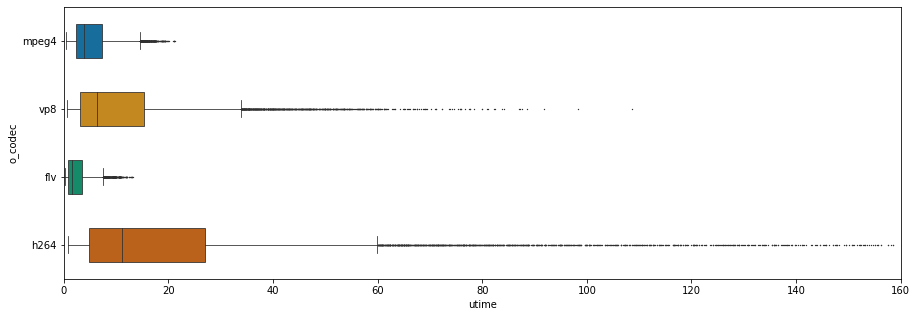

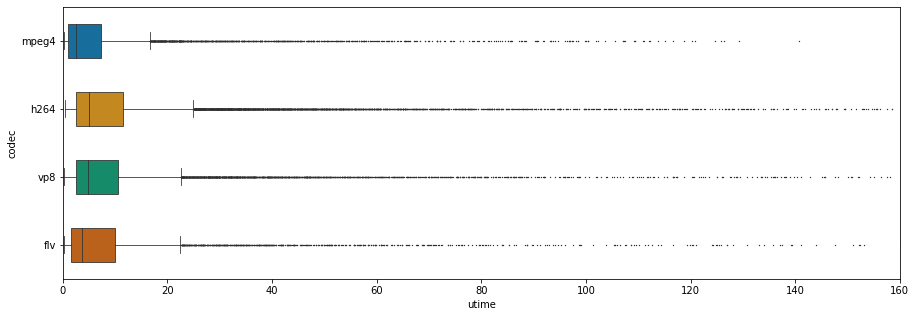

In [ ]:
trans_target = ['utime']
cols = ['o_codec', 'codec']

a4_dims = (15, 5)
fig, ax = plt.subplots(figsize=a4_dims)

df  = transcoding_df
sns.boxplot(y=df['o_codec'], x=df['utime'], 
                data= df, 
                palette="colorblind", width=.5, linewidth =.8, ax = ax, fliersize = .5
                )
plt.xlim([0, 160])

a4_dims = (15, 5)
fig, ax = plt.subplots(figsize=a4_dims)

df  = transcoding_df
sns.boxplot(y=df['codec'], x=df['utime'], 
                data= df, 
                palette="colorblind", width=.5, linewidth =.8, ax = ax, fliersize = .5
                )
plt.xlim([0, 160])




## Feature selection

In [ ]:

#https://github.com/marcotcr/lime/issues/293
#https://hub.packtpub.com/4-ways-implement-feature-selection-python-machine-learning/
print(df.shape)
print(df.iloc[:,15].shape)

def mi_implement(df, target):
  
  for x in target:
    mi = mutual_info_regression(df.iloc[:,2:15],df.loc[:,x] ) ##error with dtime
    d[x]= mi

def f_implement(df, target):
  
  for x in target:
    f_ = f_regression(df.iloc[:,2:15],df.loc[:,x] ) ##error with dtime
    f[x]= f_

f={}
d = {} 

mi_implement(day_df, bike_target_vars)
  
f_implement(day_df, bike_target_vars)

import numpy as np ## will move to import lib sub
def print_mi_scores():
  for x, y in d.items():
    print('\nThe mutual_info_regression for {} are: {} '.format(x,y))
    print(np.argsort(d[x]))


def print_f_scores():
  for x, (a, b) in f.items():
    print('\nThe F scores for {} are:{} '.format(x,a))
    print('\nThe pval is {}'.format(b))
    print(np.argsort(f[x]))


  
print_mi_scores()
print_f_scores()




(62, 16)
(62,)

The mutual_info_regression for casual are: [1.43967653e+02 3.44890586e+02 6.20046245e+01 3.42144104e+00
 3.33109137e+00 2.73674228e+00 7.07292978e+01 4.73471711e+02
 4.82454311e+02 7.46194000e+00 4.24378416e+01 6.02910207e+02
 6.14850370e+03] 
[ 3 10  9  6  1  5  4  0  2  7  8 12 11]

The mutual_info_regression for registered are: [1.43967653e+02 3.44890586e+02 6.20046245e+01 3.42144104e+00
 3.33109137e+00 2.73674228e+00 7.07292978e+01 4.73471711e+02
 4.82454311e+02 7.46194000e+00 4.24378416e+01 6.02910207e+02
 6.14850370e+03] 
[ 3 10  9  6  5  4  0  2  1  7  8 11 12]

The mutual_info_regression for cnt are: [1.43967653e+02 3.44890586e+02 6.20046245e+01 3.42144104e+00
 3.33109137e+00 2.73674228e+00 7.07292978e+01 4.73471711e+02
 4.82454311e+02 7.46194000e+00 4.24378416e+01 6.02910207e+02
 6.14850370e+03] 
[ 3  5  4  9 10  6  0  1  2  7  8 11 12]

The F scores for casual are:[ 33.76597821  47.99907687  11.19955141   2.15375168   2.62706977
 267.40499289  47.50957705 305.

/usr/local/lib/python3.7/dist-packages/sklearn/feature_selection/_univariate_selection.py:304: RuntimeWarning: divide by zero encountered in true_divide
  F = corr ** 2 / (1 - corr ** 2) * degrees_of_freedom


# Datasets

## Bike Dataset


### Data Inspection

#### Report

In [ ]:

day_report = ProfileReport(day_df)
print(repr(day_report.report))
print(day_report.report.content)
day_report.to_notebook_iframe()

Summarize dataset:   0%|          | 0/29 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Root
{'body': Container(name=Root), 'footer': HTML, 'name': 'Root'}


Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### Histogram (cnt vs day of month)

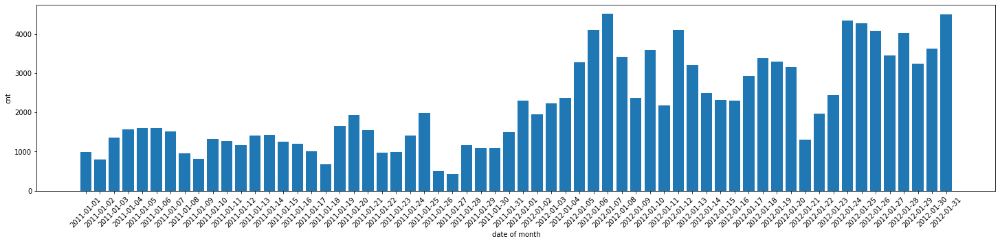

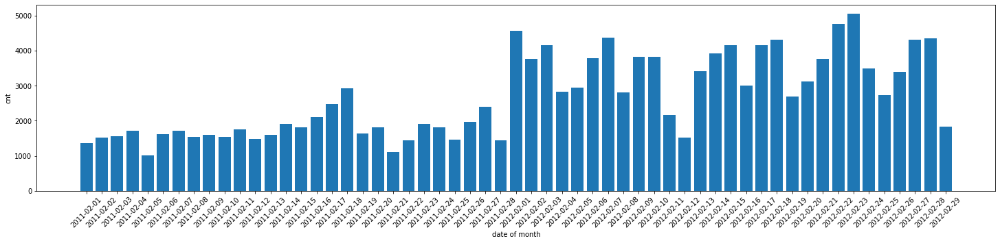

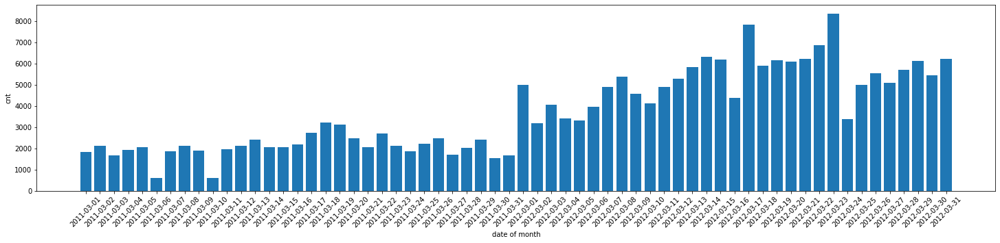

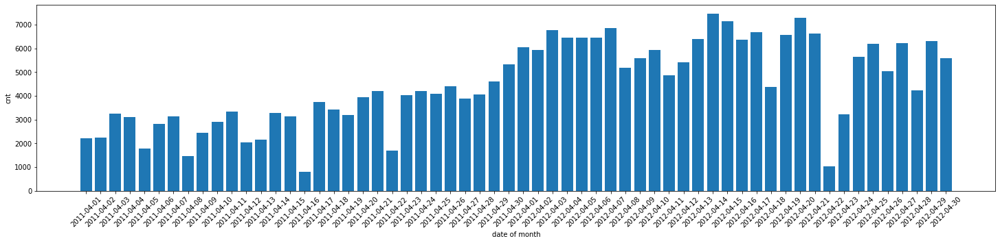

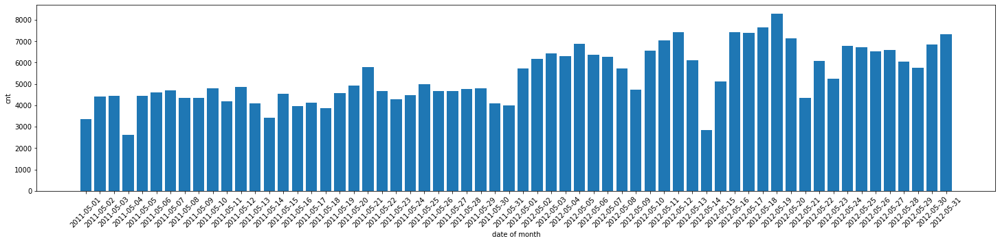

...

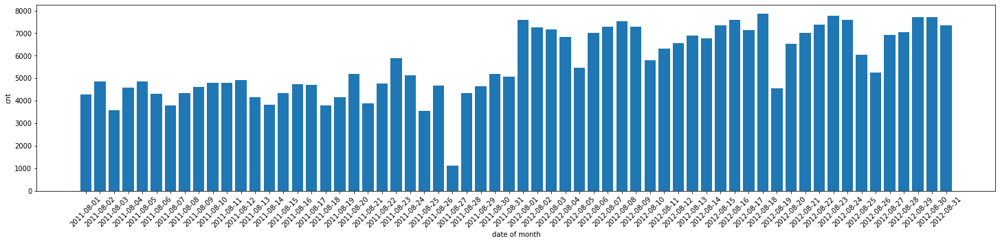

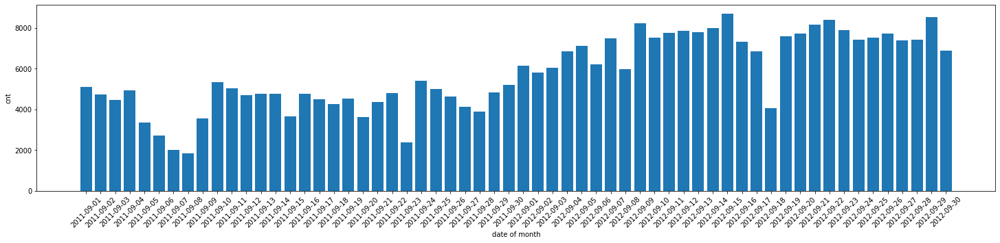

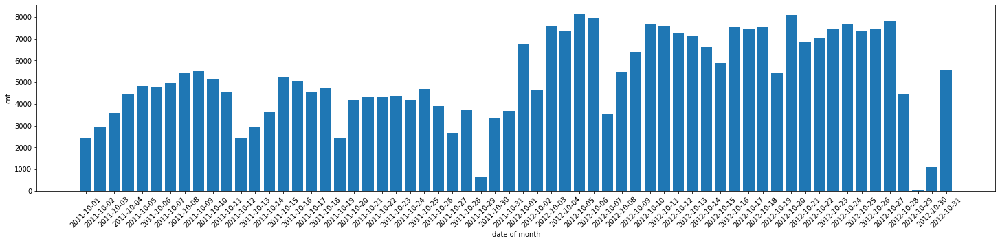

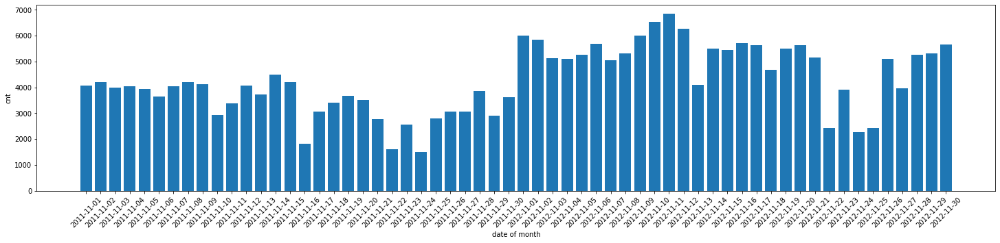

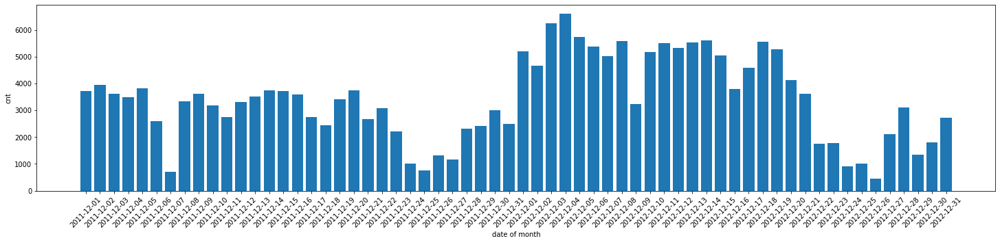

In [ ]:
'''Plotting a histogram for each month 
  - using the dteday instead of work or weekday
  - y axis is cnt'''

for idx in range(1,13):
  temp = day_df[day_df['mnth']==idx]
  plt.figure(figsize=(25, 5))
  plt.bar(temp['dteday'], temp['cnt'])
  plt.xticks(rotation = 45)
  plt.xlabel('date of month')
  plt.ylabel('cnt')
  plt.show()

#### Boxplots

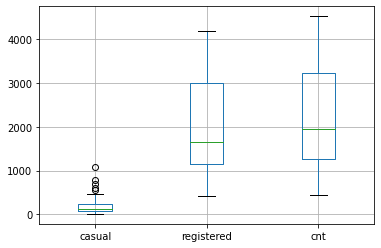

In [ ]:
''' categorical features of target variables for biking data'''

bike_target_vars = ['casual', 'registered', 'cnt']
df = day_df[day_df['mnth']==1]

boxplot = df.boxplot(column=bike_target_vars)

### Categorical Features + Standardization

In [ ]:
day_df = pd.read_csv('/content/drive/MyDrive/4. Project 4 - Regression Analysis /day.csv')
from sklearn.feature_selection import f_regression


preprocess = make_column_transformer(
    (StandardScaler(), ['season', 'yr', 'mnth', 'holiday', 'weekday',
       'workingday', 'weathersit', 'temp', 'atemp', 'hum', 'windspeed']), 
     
    remainder ='passthrough'    
)


standardized_data = []
bike_cols = day_df.columns
x_bike = preprocess.fit_transform(day_df[bike_cols]) 
bike_clean = x_bike[:,0:11]
bike_target = x_bike[:,15]

###Feature Selection

In [ ]:
bike_col = ['season', 'yr', 'mnth', 'holiday', 'weekday',
       'workingday', 'weathersit', 'temp', 'atemp', 'hum', 'windspeed'
       ]
mutual_info_bike_target = mutual_info_regression(bike_clean,bike_target)

print('Mutual Information between count and features:\n')
for i in range(0, len(bike_col)):
    print(bike_col[i],': ', mutual_info_bike_target[i])

f = {}
df = day_df
f, pval = f_regression(df.iloc[:,2:13],df.loc[:,'cnt'] ) ##error with dtime

print('\n\n F Score and P-Value:\n')
for i in range(0,len(bike_col)):
    print(i,'. ', bike_col[i],', F score:',f[i], ',     P Value: ',pval[i])    


Mutual Information between count and features:

season :  0.2145429300245203
yr :  0.2773231994903549
mnth :  0.37862837263313187
holiday :  0.011512657465930554
weekday :  0.0448600426812793
workingday :  0.02181675183786691
weathersit :  0.0649471208926089
temp :  0.3887679767949783
atemp :  0.46441733617084324
hum :  0.04543535262581688
windspeed :  0.05534508900120061


 F Score and P-Value:

0 .  season , F score: 143.9676525909154 ,     P Value:  2.133996684343797e-30
1 .  yr , F score: 344.8905855356845 ,     P Value:  2.4835399044501753e-63
2 .  mnth , F score: 62.00462454833198 ,     P Value:  1.2431117778656476e-14
3 .  holiday , F score: 3.421441039972211 ,     P Value:  0.064759357926115
4 .  weekday , F score: 3.331091365174518 ,     P Value:  0.06839080695470057
5 .  workingday , F score: 2.7367422831913517 ,     P Value:  0.0984949616002635
6 .  weathersit , F score: 70.72929782920825 ,     P Value:  2.150975821424902e-16
7 .  temp , F score: 473.4717105349773 ,     P Va

In [ ]:
bike_feat = bike_clean[:, [0,1,2,6,7,8,10]]

## Master

### Data Inspection 

In [ ]:
top_ten_countries =[ 'Antigua','Grenada','Iceland','Malta','Mauritius','Netherlands','Singapore','Republic of Korea','Thailand','Spain']
top_ten_df = master_df[master_df['country'].isin(top_ten_countries)]


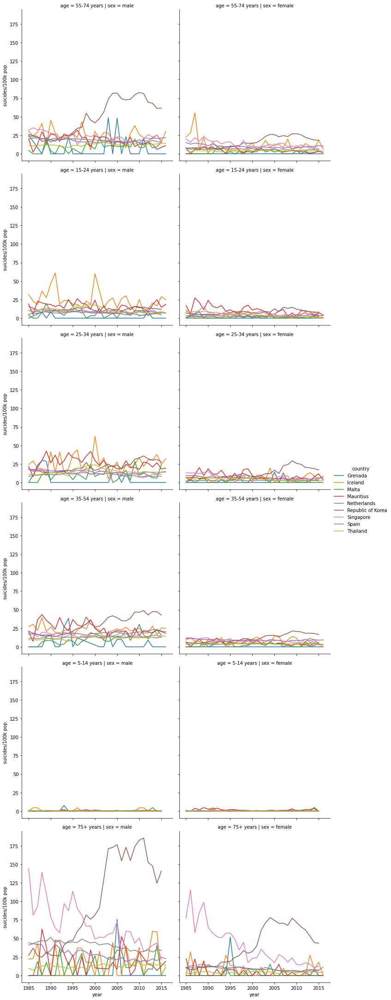

In [ ]:


sns.relplot(data=top_ten_df,  x="year",y="suicides/100k pop", kind ='line', hue ='country', row = 'age', col='sex')



(0.0, 1000.0)

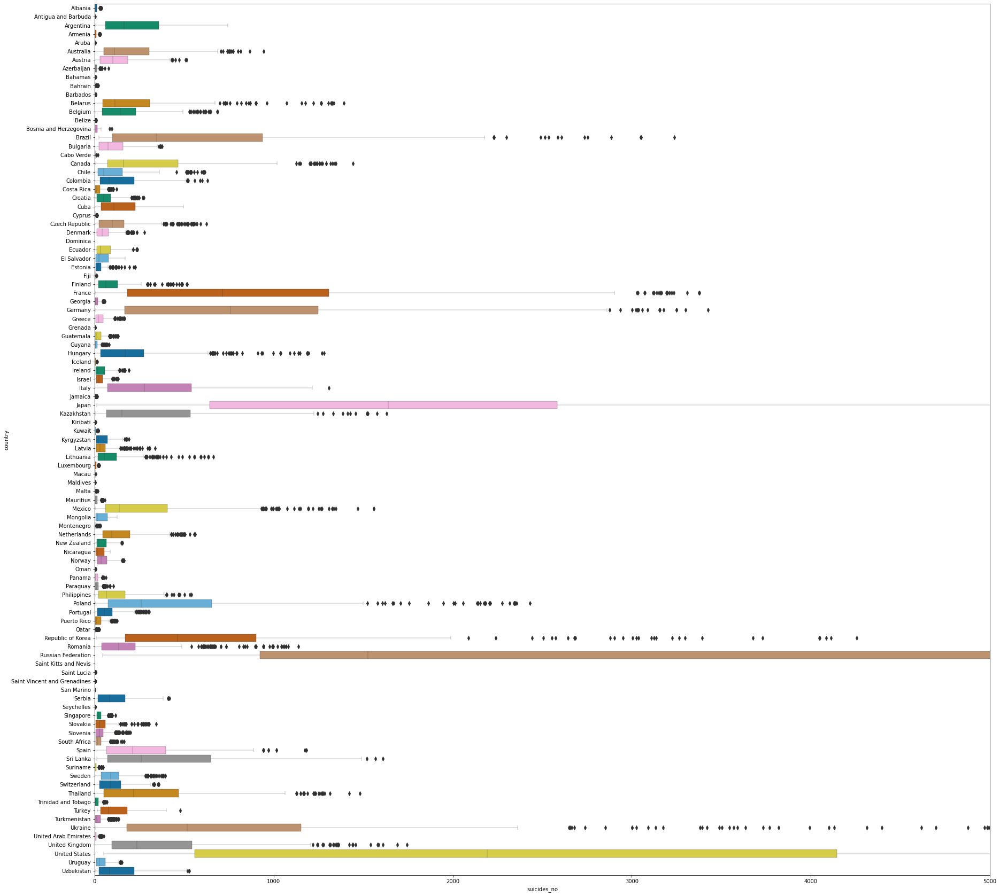

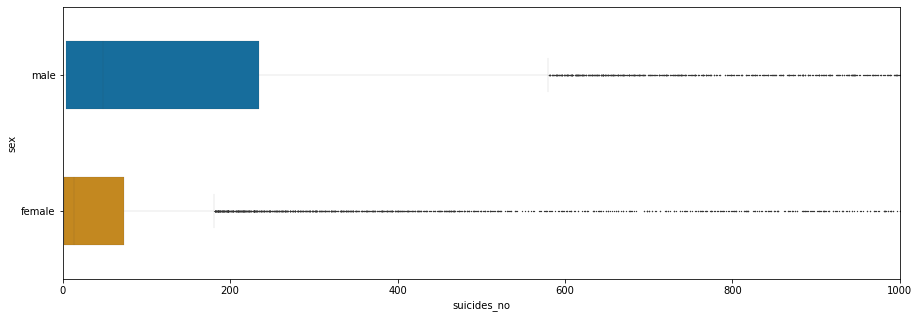

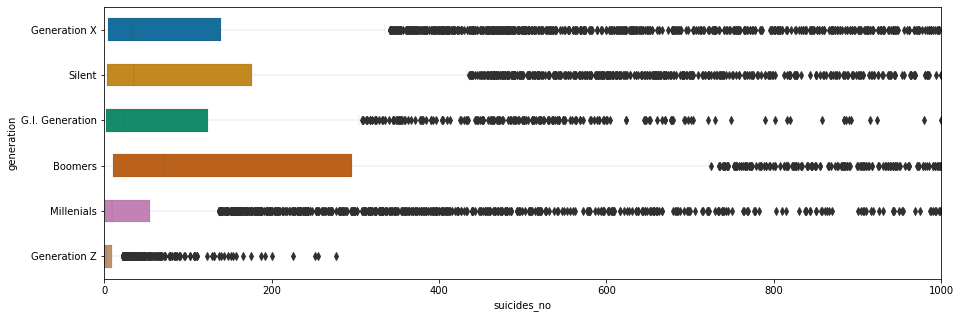

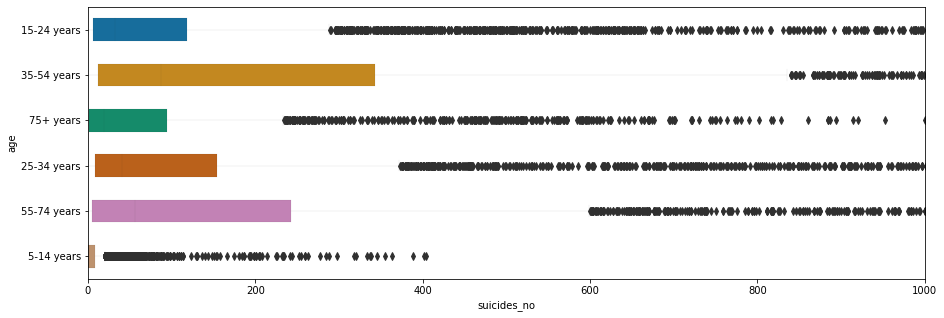

In [ ]:

a4_dims = (30, 30)
fig1, ax1 = plt.subplots(figsize=a4_dims)

#plt.xticks(rotation=90)


sns.boxplot(y=master_df['country'], x=master_df['suicides_no'], 
                 data=master_df, 
                 palette="colorblind", width=.9, linewidth =.3, ax = ax1
                 )#, hue='year').subplots(figsize=(20, 10))
plt.xlim([0, 5000])
fig1.show()


a4_dims = (15, 5)
fig2, ax2 = plt.subplots(figsize=a4_dims)

sns.boxplot(y=master_df['sex'], x=master_df['suicides_no'], 
                data=master_df, 
                palette="colorblind", width=.5, linewidth =.1, ax = ax2, fliersize = .5
                )
plt.xlim([0, 1000])
fig2.show()


a4_dims = (15, 5)
fig3, ax3 = plt.subplots(figsize=a4_dims)
sns.boxplot(y=master_df['generation'], x=master_df['suicides_no'], 
                data=master_df, 
                palette="colorblind", width=.5, linewidth =.1, ax = ax3
                )
plt.xlim([0, 1000])
fig3.show()

a4_dims = (15, 5)
fig4, ax4 = plt.subplots(figsize=a4_dims)
sns.boxplot(y=master_df['age'], x=master_df['suicides_no'], 
                data=master_df, 
                palette="colorblind", width=.5, linewidth =.06, ax = ax4
                )

plt.xlim([0, 1000])



(0.0, 160.0)

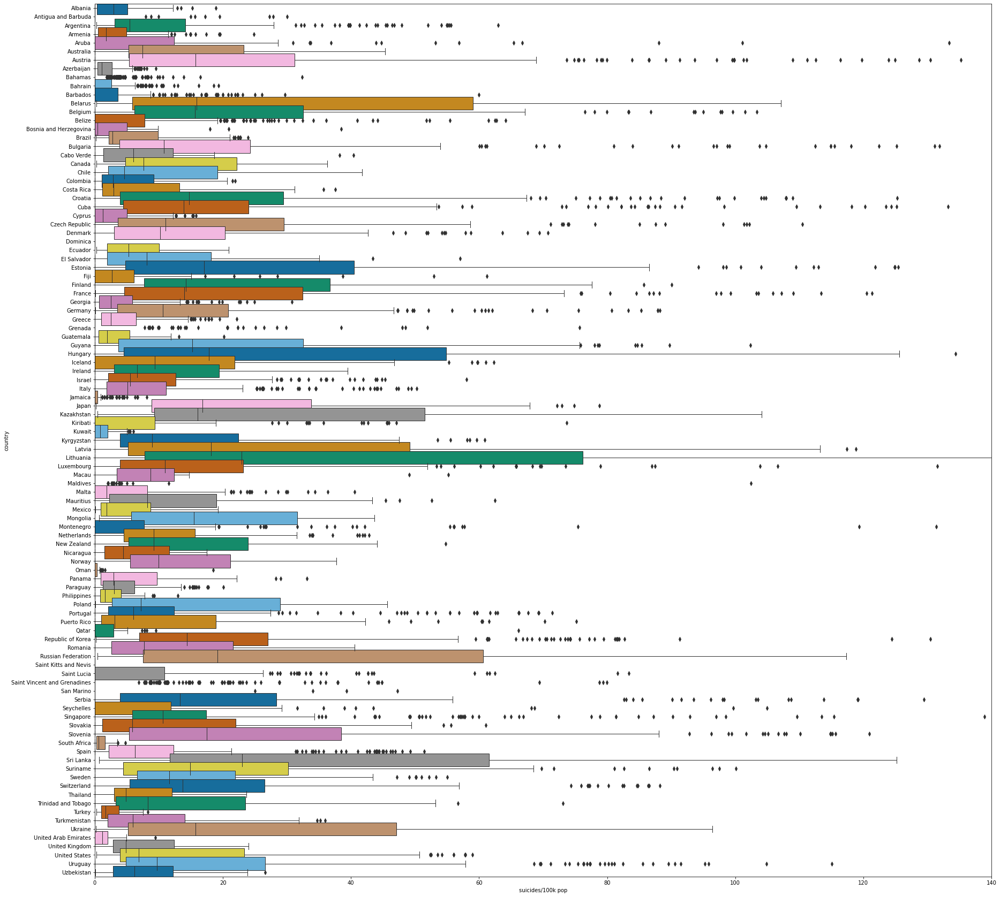

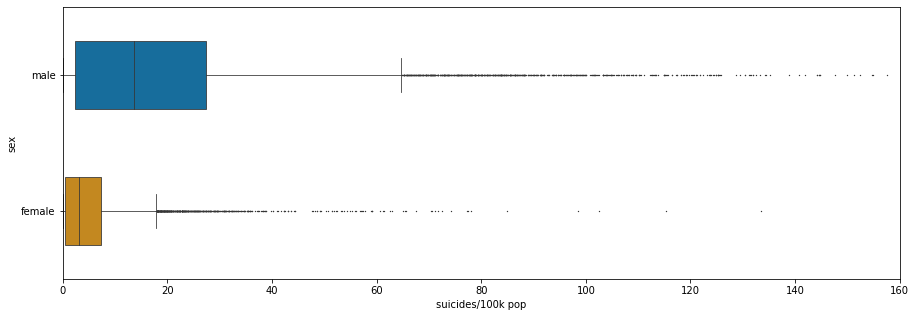

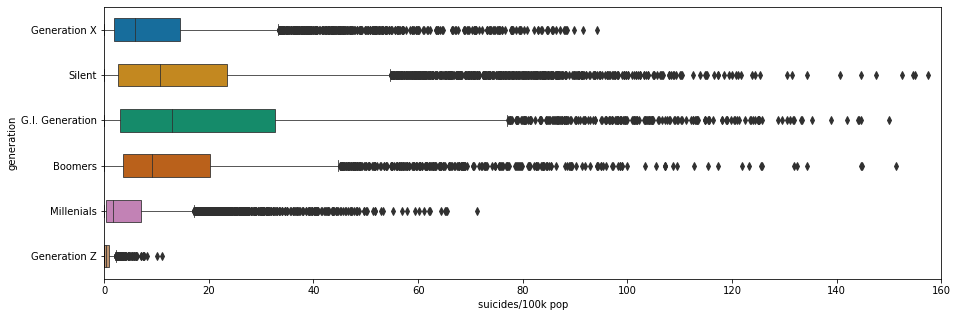

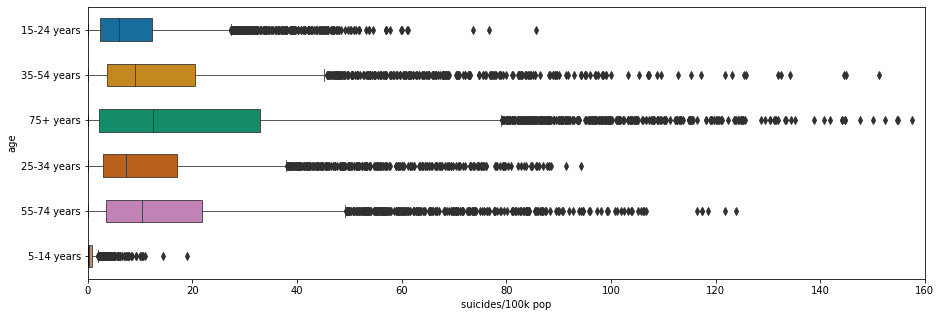

In [ ]:

a4_dims = (30, 30)
fig, ax = plt.subplots(figsize=a4_dims)


sns.boxplot(y=master_df['country'], x=master_df['suicides/100k pop'], 
                 data=master_df, 
                 palette="colorblind", width=1.5, linewidth =1, ax = ax
                 )#, hue='year').subplots(figsize=(20, 10))
plt.xlim([0, 140])


a4_dims = (15, 5)
fig, ax = plt.subplots(figsize=a4_dims)

sns.boxplot(y=master_df['sex'], x=master_df['suicides/100k pop'], 
                data=master_df, 
                palette="colorblind", width=.5, linewidth =.8, ax = ax, fliersize = .5
                )
plt.xlim([0, 160])


a4_dims = (15, 5)
fig, ax = plt.subplots(figsize=a4_dims)
sns.boxplot(y=master_df['generation'], x=master_df['suicides/100k pop'], 
                data=master_df, 
                palette="colorblind", width=.5, linewidth =.8, ax = ax
                )
plt.xlim([0, 160])

a4_dims = (15, 5)
fig, ax = plt.subplots(figsize=a4_dims)
sns.boxplot(y=master_df['age'], x=master_df['suicides/100k pop'], 
                data=master_df, 
                palette="colorblind", width=.5, linewidth =.8, ax = ax
                )

plt.xlim([0, 160])

###Add continent to country

In [ ]:
countries=master_df['country'].unique()

countries
sorted_countries = {}
countries = countries.tolist()
countries
countries.remove('Republic of Korea')

for x in countries:
  try:
    country_code = pc.country_name_to_country_alpha2(x, cn_name_format="default")

    continent_name = pc.country_alpha2_to_continent_code(country_code)

    sorted_countries[x] = continent_name
  except:
    pass

sorted_countries['Republic of Korea'] = 'AS'
sorted_countries['Saint Vincent and Grenadines'] = 'NA'
continent_list =[]
countries_grouped =[]
for x in sorted_countries.values():
  if x not in continent_list:
    continent_list.append(x)

EU_list=[]
NA_list =[]
SA_list =[]
AS_list =[]
OC_list =[]
AF_list = []
for x,y in sorted_countries.items():
  if sorted_countries[x] == 'EU':
    EU_list.append(x)
  if sorted_countries[x] == 'NA':
    NA_list.append(x)
  if sorted_countries[x] == 'SA':
    SA_list.append(x)
  if sorted_countries[x] == 'AS':
    AS_list.append(x)
  if sorted_countries[x] == 'OC':
    OC_list.append(x)
  if sorted_countries[x] == 'AF':
    AF_list.append(x)
all_df =pd.DataFrame({'EU':pd.Series(EU_list), 
                  'NA': pd.Series(NA_list), 
                  'SA': pd.Series(SA_list), 
                  'AS': pd.Series(AS_list), 
                  'OC': pd.Series(OC_list), 
                  "AF": pd.Series(AF_list)}
                  )
sorted_count_df = master_df.copy()
sorted_count_df.insert(1, 'Continent', pd.Series() )


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.


In [ ]:

df= sorted_count_df


for x in AS_list:  # if this is true then place this, otherwise return the original
  sorted_count_df['Continent'] = pd.np.where(df.country.str.contains(x), "AS", sorted_count_df['Continent'])

for x in AF_list:
  sorted_count_df['Continent'] = pd.np.where(df.country.str.contains(x), "AF", sorted_count_df['Continent'])


for x in OC_list:
  sorted_count_df['Continent'] = pd.np.where(df.country.str.contains(x), "OC", sorted_count_df['Continent'])

for x in EU_list:
  sorted_count_df['Continent'] = pd.np.where(df.country.str.contains(x), "EU", sorted_count_df['Continent'])


for x in NA_list:
  sorted_count_df['Continent'] = pd.np.where(df.country.str.contains(x), "NA", sorted_count_df['Continent'])

for x in SA_list:
  sorted_count_df['Continent'] = pd.np.where(df.country.str.contains(x), "SA", sorted_count_df['Continent'])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead
  if __name__ == '__main__':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead
  del sys.path[0]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead
  app.launch_new_instance()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: FutureWarning: The pandas.np module is deprecated and will be remov

In [ ]:
print(sorted_count_df.shape)
sorted_count_df



(27820, 13)


,country,Continent,year,sex,age,suicides_no,population,suicides/100k pop,country-year,HDI for year,gdp_for_year ($),gdp_per_capita ($),generation
0,Albania,EU,1987,male,15-24 years,21,312900,6.71,Albania1987,NaN,"2,156,624,900",796,Generation X
1,Albania,EU,1987,male,35-54 years,16,308000,5.19,Albania1987,NaN,"2,156,624,900",796,Silent
2,Albania,EU,1987,female,15-24 years,14,289700,4.83,Albania1987,NaN,"2,156,624,900",796,Generation X
3,Albania,EU,1987,male,75+ years,1,21800,4.59,Albania1987,NaN,"2,156,624,900",796,G.I. Generation
4,Albania,EU,1987,male,25-34 years,9,274300,3.28,Albania1987,NaN,"2,156,624,900",796,Boomers
...,...,...,...,...,...,...,...,...,...,...,...,...,...
27815,Uzbekistan,AS,2014,female,35-54 years,107,3620833,2.96,Uzbekistan2014,0.675,"63,067,077,179",2309,Generation X
27816,Uzbekistan,AS,2014,female,75+ years,9,348465,2.58,Uzbekistan2014,0.675,"63,067,077,179",2309,Silent
27817,Uzbekistan,AS,2014,male,5-14 years,60,2762158,2.17,Uzbekistan2014,0.675,"63,067,077,179",2309,Generation Z
27818,Uzbekistan,AS,2014,female,5-14 years,44,2631600,1.67,Uzbekistan2014,0.675,"63,067,077,179",2309,Generation Z


### One hot encoding for Master


In [ ]:
from sklearn.feature_selection import f_regression
'''
preprocess is a 'pipeline' for preprocessing a DataFrame

StandardScaler = Standardize features by removing the mean and scaling to unit variance
OneHotEncoder = Encode categorical features as a one-hot numeric array


'''
'''the preprocess method has to be changed accordding to the dataframe. it currently has the master.csv 

since it shows the one- hot encoding better'''

preprocess = make_column_transformer(
    (OneHotEncoder(sparse=False), ['Continent','sex', 'age','generation']),
    (StandardScaler(), ['population', 'gdp_per_capita ($)', 'suicides_no', 'year']), 
    remainder ='passthrough'    
)


master_cols = sorted_count_df.columns
x_master = preprocess.fit_transform(sorted_count_df[master_cols]) 
master_clean = x_master[:,0:24]
master_target_df = sorted_count_df['suicides/100k pop']
master_target = pd.DataFrame(master_target_df).to_numpy()


In [ ]:

'''
Cont
0 - AF
1 - AS
2 - EU
3 - NA
4 - OC
5 - SA
Gender
6 - Female
7 - Male
8-13 age
8 - 15-24
10 - 35-54
11 - 5-14
12 - 55-74
13 - 75+
Generation
14 - Boomers
15 - G.I.Generation
16 - Generation X
17 - Generation Z
18 - Millenials
19 - Silent
'''


In [ ]:
master_encoded_cols = ['Africa', 'Asia', 'Europe', 'North America', 'Oceania', 'South America', 'Female', 'Male',
                           '15-24', '35-54', '5-14', '55-74', '75+', 'Boomers', 'G.I. Generation', 'Generation X', 'Generation Z', 'Millenials', 'Silent',
                           'Population', 'GDP Per Capita', 'Number of Suicides', 'Year']
mutual_info_master_target = mutual_info_regression(master_clean,master_target)

print('Mutual Information between suicides/100k and features:\n')
for i in range(0, len(master_encoded_cols)):
    print(master_encoded_cols[i],': ', mutual_info_master_target[i])

f = {}
df = master_df
f, pval = f_regression(master_clean,df.loc[:,'suicides/100k pop'] ) ##error with dtime

print('\n\n F Score and P-Value:\n')
for i in range(0,len(master_encoded_cols)):
    print(i,'. ', master_encoded_cols[i],', F score:',f[i], ',     P Value: ',pval[i])    

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Mutual Information between suicides/100k and features:

Africa :  0.0023815704666181325
Asia :  0.012675724501414631
Europe :  0.038959598962064135
North America :  0.042854447601373025
Oceania :  0.006334712836827627
South America :  0.015009826212970534
Female :  0.1387707243514682
Male :  0.13163179463197627
15-24 :  0.029083172499539955
35-54 :  0.021102726884357992
5-14 :  0.009944633787011714
55-74 :  0.21990054834108763
75+ :  0.025020730528599433
Boomers :  0.03421032526984957
G.I. Generation :  0.019819216891598934
Generation X :  0.024277017676901824
Generation Z :  0.006626400155068435
Millenials :  0.058536975862405694
Silent :  0.047273948231584484
Population :  0.031995299489298024
GDP Per Capita :  0.5858516970421563
Number of Suicides :  0.18915559863974973
Year :  0.7139550374254116


 F Score and P-Value:

0 .  Africa , F score: 66.93963431264717 ,     P Value:  2.9178246134584683e-16
1 .  Asia , F score: 66.18741307664381 ,     P Value:  4.2696414590000695e-16
2 .  E

In [ ]:
master_feat = master_clean[:,(2,3,6,7,8,11,13,15,17,18,19,22)]

### 3.2.1 Linear Regression

In [ ]:
preprocessed_data = preprocessed_data[:, 0:23]
targets = sorted_count_df['suicides/100k pop']
print(targets.shape)
preprocessed_data.shape

(27820,)


(27820, 23)

### 3.2.1 Linear Regression

In [ ]:
def rmse_cal(algo, data, target_var):
    X_train = []
    X_test = []
    y_train = []
    y_test = []
    kf = KFold(n_splits=10)
    test_rmse = 0
    train_rmse = 0
    for trainset, testset in kf.split(data,target_var):

        X_train = data[trainset,:]
        y_train = target_var[trainset]
        X_test = data[testset,:]
        y_test = target_var[testset]
        y_train = y_train.astype('int')
        algo.fit(X_train, y_train)
        test_predictions = algo.predict(X_test)
        train_predictions = algo.predict(X_train)
        test_rmse = test_rmse + mean_squared_error(y_test, test_predictions, squared=False)
        train_rmse = train_rmse + mean_squared_error(y_train, train_predictions, squared=False)
    test_rmse = (test_rmse/10)
    train_rmse = (train_rmse/10)

    return train_rmse, test_rmse

In [ ]:

X = preprocessed_data
y = targets
X_train = []
X_test = []
y_train = []
y_test = []

train_rmse=[]
test_rmse=[]



def rmse_cal(algo, data, target_var):
    X_train = []
    X_test = []
    y_train = []
    y_test = []
    kf = KFold(n_splits=10)
    test_rmse = 0
    train_rmse = 0
    for trainset, testset in kf.split(data,target_var):

        X_train = data[trainset,:]
        y_train = target_var[trainset]
        X_test = data[testset,:]
        y_test = target_var[testset]
        y_train = y_train.astype('int')
        algo.fit(X_train, y_train)
        test_predictions = algo.predict(X_test)
        train_predictions = algo.predict(X_train)
        test_rmse = test_rmse + mean_squared_error(y_test, test_predictions, squared=False)
        train_rmse = train_rmse + mean_squared_error(y_train, train_predictions, squared=False)
    test_rmse = (test_rmse/10)
    train_rmse = (train_rmse/10)

    return train_rmse, test_rmse






def regression(processed_data, targets):

  algo = LinearRegression(normalize=True)

  #https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.cross_val_predict.html#sklearn.model_selection.cross_val_predict
  predicted = cross_val_predict(algo,master_clean, targets, cv=10)
  y = targets

  lr_fig, ax = plt.subplots()
  ax.scatter(y, predicted, edgecolors=(0, 0, 0))
  ax.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=4)
  ax.set_xlabel('Measured - using ordinary least squares regression')
  ax.set_ylabel('Predicted  - using ordinary least squares regression')
  plt.show()

  algo = Lasso()
  predicted = cross_val_predict(algo, master_clean, targets, cv=10)
  y = targets
  lasso_fig, ax = plt.subplots()
  ax.scatter(y, predicted, edgecolors=(0, 0, 0))
  ax.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=4)
  ax.set_xlabel('Measured - using Lasso regression')
  ax.set_ylabel('Predicted - using Lasso regression')
  plt.show()


  algo = Ridge()
  predicted = cross_val_predict(algo, master_clean, targets, cv=10)
  y = targets
  lasso_fig, ax = plt.subplots()
  ax.scatter(y, predicted, edgecolors=(0, 0, 0))
  ax.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=4)
  ax.set_xlabel('Measured - using Ridge regression')
  ax.set_ylabel('Predicted - using Ridge regression')
  plt.show()


  

regression(master_clean, targets)

lasso_rmse = rmse_cal(Lasso(), master_clean, targets)   
linear_rmse = rmse_cal(LinearRegression(normalize=True), master_clean, targets) 
ridge_rmse = ridge_rmse = rmse_cal(Ridge(), master_clean, targets)   

d={}
d['Lasso Average RMSE'] = lasso_rmse
d['Ridge RMSE'] = ridge_rmse
d['Linear RMSE'] = linear_rmse
rmse_df = pd.DataFrame(d, index = ['Suicide Dataset: Train', 'Suicide Dataset:  Test' ])
rmse_df


###3.2.2 Polynomial Regression

In [ ]:
features_test = ['population', 'year', 'suicides_no', 'gdp_per_capita ($)']  
#features that will be sent to linear regression function after increasing up to a degree

y = master_df['suicides/100k pop']
 # target variable 

dlr = {}  #containers
dlasso = {}
dridge = {}

x= master_df[features_test].values # the values of the features only 


upper_bound = 5

## getting values over all 

for deg in range(1, upper_bound):

  poly = PolynomialFeatures(degree = deg)
  x_new = poly.fit_transform(x)
  train, test = rmse_cal(Lasso(alpha = 0.005), x_new, y) 
  dlr[deg] = [ train, test]



for deg in range(1, upper_bound):

  poly = PolynomialFeatures(degree = deg)
  x_new = poly.fit_transform (x)
  train, test = rmse_cal(LinearRegression(), x_new, y) 
  dlasso[deg] = [ train, test]


for deg in range(1, upper_bound):

  poly = PolynomialFeatures(degree = deg)
  x_new = poly.fit_transform (x)
  train, test = rmse_cal(Ridge(), x_new, y) 
  dridge[deg] = [ train, test]




In [ ]:
lr_df = pd.DataFrame.from_dict(dlasso)
lr_df.index = ['LR train', 'LR test']
lr_df = lr_df.add_prefix('degree_')  

lasso_df = pd.DataFrame.from_dict(dlr)
lasso_df.index = ['Lasso train', 'Lasso test']
lasso_df = lasso_df.add_prefix('degree_') 

ridge_df =pd.DataFrame.from_dict(dridge)
ridge_df.index = ['Ridge train', 'Ridge test']
ridge_df = ridge_df.add_prefix('degree_') 

pd.concat([lr_df, ridge_df, lasso_df])

,degree_1,degree_2,degree_3,degree_4
LR train,17.429160,16.239013,14.979989,17.267470
LR test,17.472831,18.701238,37.068653,126.440270
Ridge train,17.429160,16.235515,14.919723,15.009597
Ridge test,17.472831,18.701747,40.076331,182.017151
Lasso train,17.429160,16.269587,15.048106,14.515364
Lasso test,17.472839,18.488901,30.651420,42.655445


In [ ]:
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error
from sklearn.neural_network import MLPRegressor
'''
hidden layer sizes lets you choose how many layers and how many nodes per layer
weight decay  is inversely used to decrease the learning rate per iteration 
'''
def neural_network(data, target_var, hidden_layer_sizes, weight_decay):
    X_train = []
    X_test = []
    y_train = []
    y_test = []
    kf = KFold(n_splits=10)
    test_rmse = 0
    train_rmse = 0
    for trainset, testset in kf.split(data,target_var):
        X_train = data[trainset,:]
        y_train = target_var[trainset]
        X_test = data[testset,:]
        y_test = target_var[testset]
        y_train = y_train.astype('int')
        nn = MLPRegressor(hidden_layer_sizes = hidden_layer_sizes, alpha = weight_decay, activation = 'relu').fit(X_train,y_train)
        test_predictions = nn.predict(X_test)
        train_predictions = nn.predict(X_train)
        test_rmse = test_rmse + mean_squared_error(y_test, test_predictions, squared=False)
        train_rmse = train_rmse + mean_squared_error(y_train, train_predictions, squared=False)
    test_rmse = test_rmse/10
    train_rmse = train_rmse/10

    return train_rmse, test_rmse

train, test = neural_network(preprocessed_data, targets, (100,50), 0.99)
print('Average Suicide Dataset train RMSE: ', train,'\nAverage Suicide Dataset test RMSE: ', test)

In [ ]:
decay_values = [.1,.2,.3,.4,.5,.6,.7,.8,.9]
train = np.zeros(len(decay_values))
test = np.zeros(len(decay_values))
i = 0
for val in decay_values:
    train[i], test[i] = neural_network(preprocessed_data, targets, (256, 128, 64, 32, 16), val)
    i = i + 1

In [ ]:
for i in range(0, i+2):
    
    print('Decay Value: ',decay_values[i], '\nTrain RMSE: ', train[i],'\nTest RMSE: ', test[i], '\n\n')

In [ ]:
temp = {}

for val in range(len(decay_values)):
    temp[decay_values[val]] = [train[val], test[val]]



In [ ]:
nn_df = pd.DataFrame.from_dict(temp )
nn_df.index = index=  [ 'Train RMSE', 'Test RMSE']
nn_df.add_prefix('Weight_decay_')


# Video Transcoding

## Data Inspection

### Heat map

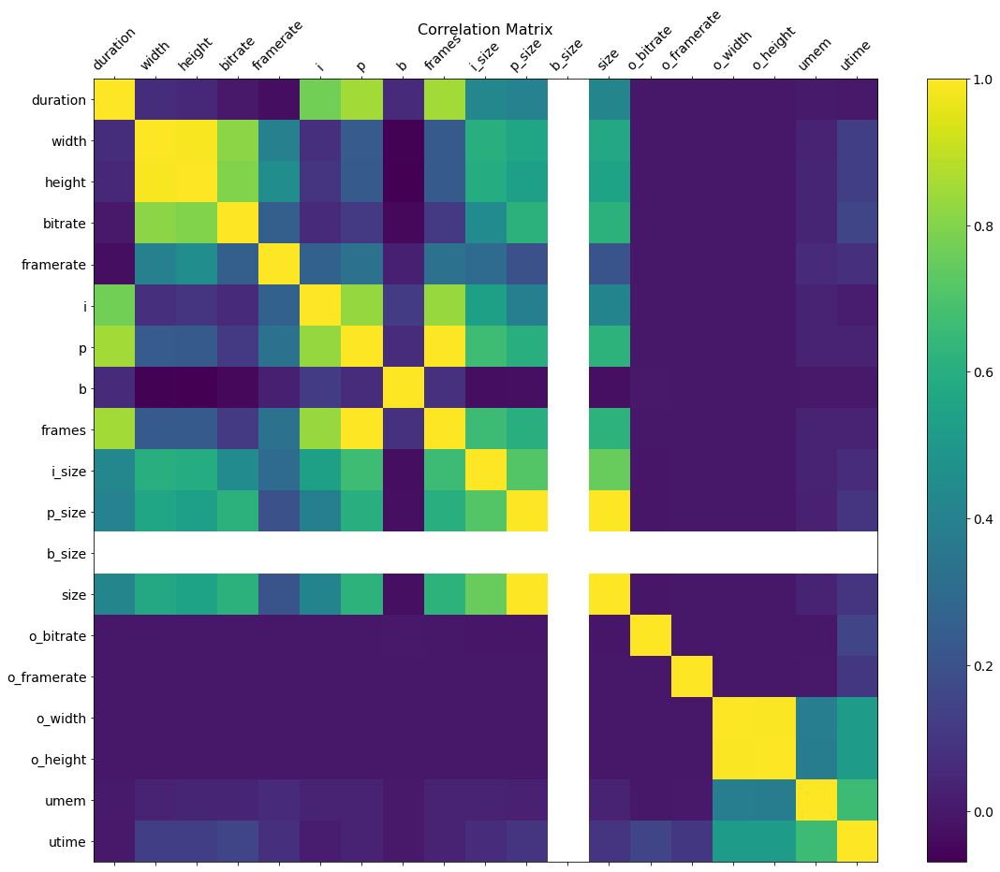

In [ ]:
'''
Plot heatmap
'''

f = plt.figure(figsize=(19, 15))
plt.matshow(transcoding_df.corr(), fignum=f.number)
plt.xticks(range(transcoding_df.select_dtypes(['number']).shape[1]), transcoding_df.select_dtypes(['number']).columns, fontsize=14, rotation=45)
plt.yticks(range(transcoding_df.select_dtypes(['number']).shape[1]), transcoding_df.select_dtypes(['number']).columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Correlation Matrix', fontsize=16)
f

### Report

In [ ]:
'''
Print report of dataframe
    Includes histograms (Q2), distribution of video transcoding times (Q6)
'''

from pandas_profiling import ProfileReport


transcoding_report = ProfileReport(transcoding_df)
print(repr(transcoding_report.report))
print(transcoding_report.report.content)
transcoding_report.to_notebook_iframe()

### Boxplots

(0.0, 160.0)

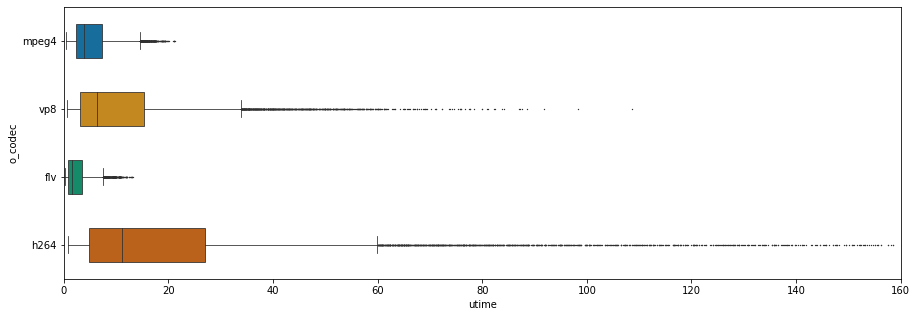

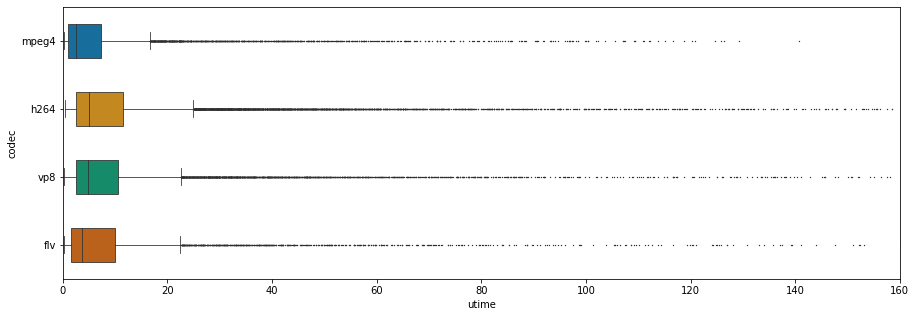

In [ ]:
trans_target = ['utime']
cols = ['o_codec', 'codec']

a4_dims = (15, 5)
fig, ax = plt.subplots(figsize=a4_dims)

df  = transcoding_df
sns.boxplot(y=df['o_codec'], x=df['utime'], 
                data= df, 
                palette="colorblind", width=.5, linewidth =.8, ax = ax, fliersize = .5
                )
plt.xlim([0, 160])

a4_dims = (15, 5)
fig, ax = plt.subplots(figsize=a4_dims)

df  = transcoding_df
sns.boxplot(y=df['codec'], x=df['utime'], 
                data= df, 
                palette="colorblind", width=.5, linewidth =.8, ax = ax, fliersize = .5
                )
plt.xlim([0, 160])




## Categorical Features + Standardization

In [ ]:
def clean_transcoding(df):
    '''
    Performs one-hot encoing and feature selection for the transcoding video 
    dataset

    Returns features in one DataFrame and target in another
    '''
    # one-hot encoding
    replace = ['mpeg4', 'vp8', 'flv', 'h264']
    for i in range(len(replace)):  # if this is true then place this, otherwise return the original
        df['codec'] = np.where(df['codec'] == replace[i], i, df['codec'])
        df['o_codec'] = np.where(df['o_codec'] == replace[i], i, df['o_codec'])
        
    # remove id
    df = df.drop(columns=['id'])
    target_var = 'utime'
    # separate target 
    target = df[[target_var]]
    df = df.drop(columns=target_var)
    df = df.drop(columns='umem')
        
    # standardize columns
    for feature in df:

        # Create a standard scalers processor object
        std_scaler = StandardScaler()
    
        # Convert column values to floats and then standardize
        x = df[[feature]].values.astype(float)
        x_scaled = std_scaler.fit_transform(x)

        # Run the normalizer on the dataframe
        df[[feature]] = x_scaled

    return [df, target]

In [ ]:
transcoding_df = pd.read_csv('/content/drive/MyDrive/4. Project 4 - Regression Analysis /transcoding_measurement.csv')
transcoding_clean_df, transcoding_target_df = clean_transcoding(transcoding_df)
transcoding_target = transcoding_target_df.to_numpy()
transcoding_clean = transcoding_clean_df.to_numpy()

## Feature Selection

In [ ]:
transcoding_encoded_cols = ['duration', 'codec', 'width', 'height', 'bitrate',
       'framerate', 'i', 'p', 'b', 'frames', 'i_size', 'p_size', 'b_size',
       'size', 'o_codec', 'o_bitrate', 'o_framerate', 'o_width',
       'o_height']

mutual_info_transcoding_target = mutual_info_regression(transcoding_clean,transcoding_target)

print('Mutual Information between utime and features:\n')
for i in range(0, len(transcoding_encoded_cols)):
    print(transcoding_encoded_cols[i],': ', mutual_info_transcoding_target[i])

f = {}
df = transcoding_df
f, pval = f_regression(transcoding_clean,df.loc[:,'utime'] ) ##error with dtime

print('\n\n F Score and P-Value:\n')
for i in range(0,len(transcoding_encoded_cols)):
    print(i,'. ', transcoding_encoded_cols[i],', F score:',f[i], ',     P Value: ',pval[i]) 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


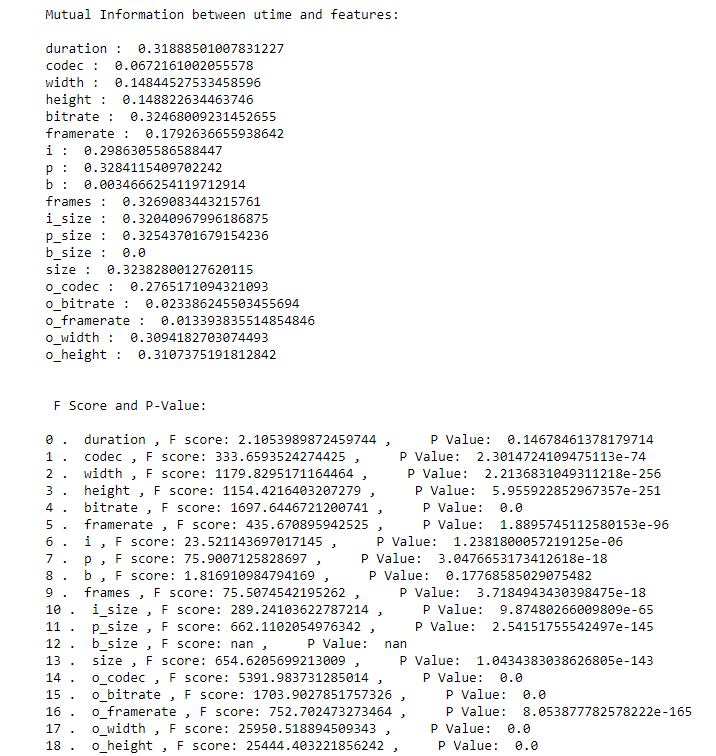

In [ ]:
transcoding_feat = transcoding_clean[:,(2,3,4,5,10,11,14,15,16,17,18)]

# Classifiers

## Linear Regression

### Bike Dataset

In [ ]:

lasso_rmse = rmse_cal(Lasso(), bike_clean, bike_target)   
linear_rmse = rmse_cal(LinearRegression(normalize=True), bike_clean, bike_target)  
ridge_rmse = ridge_rmse = rmse_cal(Ridge(), bike_clean, bike_target)  

mc={}
mc['Lasso Average RMSE'] = lasso_rmse
mc['Ridge RMSE'] = ridge_rmse
mc['Linear RMSE'] = linear_rmse
mc_rmse_df = pd.DataFrame(mc, index = ['Bike Dataset: Train', 'Bike Dataset:  Test' ])
mc_rmse_df

,Lasso Average RMSE,Ridge RMSE,Linear RMSE
Bike Dataset: Train,858.430699,858.427857,858.399295
Bike Dataset: Test,965.636596,965.600245,968.531165


In [ ]:


lasso_rmse = rmse_cal(Lasso(), bike_feat, bike_target)   
linear_rmse = rmse_cal(LinearRegression(normalize=True), bike_feat, bike_target)  
ridge_rmse = ridge_rmse = rmse_cal(Ridge(), bike_feat, bike_target)  

mc={}
mc['Lasso Average RMSE'] = lasso_rmse
mc['Ridge RMSE'] = ridge_rmse
mc['Linear RMSE'] = linear_rmse
mc_rmse_df = pd.DataFrame(mc, index = ['After FE Bike Dataset: Train', 'After FE Bike Dataset:  Test' ])
mc_rmse_df

,Lasso Average RMSE,Ridge RMSE,Linear RMSE
After FE Bike Dataset: Train,887.270500,887.278654,887.259271
After FE Bike Dataset: Test,979.450565,978.571129,980.962990


### Master Dataset

In [ ]:

master_target_df = sorted_count_df['suicides/100k pop']
lasso_rmse = rmse_cal(Lasso(), master_clean, master_target_df)   
linear_rmse = rmse_cal(LinearRegression(normalize=True), master_clean, master_target_df) 
ridge_rmse = ridge_rmse = rmse_cal(Ridge(), master_clean, master_target_df)   

m={}
m['Lasso Average RMSE'] = lasso_rmse
m['Ridge RMSE'] = ridge_rmse
m['Linear RMSE'] = linear_rmse
m_rmse_df = pd.DataFrame(m, index = ['Suicide Dataset: Train', 'Suicide Dataset:  Test' ])
m_rmse_df

,Lasso Average RMSE,Ridge RMSE,Linear RMSE
Suicide Dataset: Train,15.519176,14.538254,14.541159
Suicide Dataset: Test,15.413893,14.716115,14.700015


In [ ]:

master_target_df = sorted_count_df['suicides/100k pop']
lasso_rmse = rmse_cal(Lasso(), master_feat, master_target_df)   
linear_rmse = rmse_cal(LinearRegression(normalize=True), master_feat, master_target_df) 
ridge_rmse = ridge_rmse = rmse_cal(Ridge(), master_feat, master_target_df)   

mc={}
mc['Lasso Average RMSE'] = lasso_rmse
mc['Ridge RMSE'] = ridge_rmse
mc['Linear RMSE'] = linear_rmse
mc_rmse_df = pd.DataFrame(mc, index = ['After FE Suicide Dataset: Train', 'After FE Suicide Dataset:  Test' ])
mc_rmse_df

,Lasso Average RMSE,Ridge RMSE,Linear RMSE
After FE Suicide Dataset: Train,15.634447,14.770508,14.770498
After FE Suicide Dataset: Test,15.537173,14.759724,14.759677


### Transcoding Dataset

In [ ]:
targets = transcoding_df['utime']

lasso_rmse = rmse_cal(Lasso(), transcoding_clean, targets)   
linear_rmse = rmse_cal(LinearRegression(normalize=True), transcoding_clean, targets) 
ridge_rmse = ridge_rmse = rmse_cal(Ridge(), transcoding_clean, targets)   

mc={}
mc['Lasso Average RMSE'] = lasso_rmse
mc['Ridge RMSE'] = ridge_rmse
mc['Linear RMSE'] = linear_rmse
mc_rmse_df = pd.DataFrame(mc, index = ['Transcoding Dataset: Train', 'Transcoding Dataset:  Test' ])
mc_rmse_df


,Lasso Average RMSE,Ridge RMSE,Linear RMSE
Transcoding Dataset: Train,12.607308,12.368160,1.236795e+01
Transcoding Dataset: Test,12.596144,12.405582,1.406356e+09


In [ ]:
targets = transcoding_df['utime']

lasso_rmse = rmse_cal(Lasso(), transcoding_feat, targets)   
linear_rmse = rmse_cal(LinearRegression(normalize=True), transcoding_feat, targets)  
ridge_rmse = ridge_rmse = rmse_cal(Ridge(), transcoding_feat, targets)  

mc={}
mc['Lasso Average RMSE'] = lasso_rmse
mc['Ridge RMSE'] = ridge_rmse
mc['Linear RMSE'] = linear_rmse
mc_rmse_df = pd.DataFrame(mc, index = ['After FE Transcoding Dataset: Train', 'After FE Transcoding Dataset:  Test' ])
mc_rmse_df


,Lasso Average RMSE,Ridge RMSE,Linear RMSE
After FE Transcoding Dataset: Train,12.607308,12.377997,12.377997
After FE Transcoding Dataset: Test,12.596144,12.398913,12.398937


## Polynomial Regression

### Bike Dataset

In [ ]:

#features that will be sent to linear regression function after increasing up to a degree

y = bike_target
 # target variable 

dlr = {}  #containers
dlasso = {}
dridge = {}

x= bike_clean # the values of the features only 


upper_bound = 5

## getting values over all 

for deg in range(1, upper_bound):

  poly = PolynomialFeatures(degree = deg)
  x_new = poly.fit_transform(x)
  train, test = rmse_cal(Lasso(alpha = 0.005), x_new, y) 
  dlr[deg] = [ train, test]



for deg in range(1, upper_bound):

  poly = PolynomialFeatures(degree = deg)
  x_new = poly.fit_transform (x)
  train, test = rmse_cal(LinearRegression(), x_new, y) 
  dlasso[deg] = [ train, test]


for deg in range(1, upper_bound):

  poly = PolynomialFeatures(degree = deg)
  x_new = poly.fit_transform (x)
  train, test = rmse_cal(Ridge(), x_new, y) 
  dridge[deg] = [ train, test]


lr_df = pd.DataFrame.from_dict(dlasso)
lr_df.index = ['LR train', 'LR test']
lr_df = lr_df.add_prefix('degree_')  

lasso_df = pd.DataFrame.from_dict(dlr)
lasso_df.index = ['Lasso train', 'Lasso test']
lasso_df = lasso_df.add_prefix('degree_') 

ridge_df =pd.DataFrame.from_dict(dridge)
ridge_df.index = ['Ridge train', 'Ridge test']
ridge_df = ridge_df.add_prefix('degree_') 




In [ ]:
pd.concat([lr_df, ridge_df, lasso_df])

,degree_1,degree_2,degree_3,degree_4
LR train,858.399295,599.096683,8.160701e+02,2.258986e-10
LR test,968.531165,1154.735314,1.297224e+14,2.894874e+04
Ridge train,858.427857,607.435816,3.962648e+02,1.955076e+02
Ridge test,965.600245,957.521685,1.096889e+03,3.007559e+03
Lasso train,858.399306,599.884963,3.906269e+02,1.930105e+02
Lasso test,968.484048,986.733945,1.163403e+03,2.702554e+03


In [ ]:

#features that will be sent to linear regression function after increasing up to a degree

y = bike_target
 # target variable 

dlr = {}  #containers
dlasso = {}
dridge = {}

x= bike_feat # the values of the features only 


upper_bound = 5

## getting values over all 

for deg in range(1, upper_bound):

  poly = PolynomialFeatures(degree = deg)
  x_new = poly.fit_transform(x)
  train, test = rmse_cal(Lasso(alpha = 0.005), x_new, y) 
  dlr[deg] = [ train, test]



for deg in range(1, upper_bound):

  poly = PolynomialFeatures(degree = deg)
  x_new = poly.fit_transform (x)
  train, test = rmse_cal(LinearRegression(), x_new, y) 
  dlasso[deg] = [ train, test]


for deg in range(1, upper_bound):

  poly = PolynomialFeatures(degree = deg)
  x_new = poly.fit_transform (x)
  train, test = rmse_cal(Ridge(), x_new, y) 
  dridge[deg] = [ train, test]


lr_df = pd.DataFrame.from_dict(dlasso)
lr_df.index = ['LR train', 'LR test']
lr_df = lr_df.add_prefix('degree_')  

lasso_df = pd.DataFrame.from_dict(dlr)
lasso_df.index = ['Lasso train', 'Lasso test']
lasso_df = lasso_df.add_prefix('degree_') 

ridge_df =pd.DataFrame.from_dict(dridge)
ridge_df.index = ['Ridge train', 'Ridge test']
ridge_df = ridge_df.add_prefix('degree_') 


In [ ]:
print('After FE:')
pd.concat([lr_df, ridge_df, lasso_df])

After FE:


,degree_1,degree_2,degree_3,degree_4
LR train,887.259271,856.847224,591.406950,5.080521e+02
LR test,980.962990,1560.723829,2605.493038,5.231955e+13
Ridge train,887.278654,709.026079,581.127033,4.994182e+02
Ridge test,978.571129,982.641457,987.625549,1.725515e+03
Lasso train,887.259279,705.577900,577.340842,4.953924e+02
Lasso test,980.929545,1016.780005,1126.255455,2.090671e+03


### Master Dataset

In [ ]:
#features_test = ['population', 'year', 'suicides_no', 'gdp_per_capita ($)']  
#features that will be sent to linear regression function after increasing up to a degree

y = master_df['suicides/100k pop']
 # target variable 

dlr = {}  #containers
dlasso = {}
dridge = {}

x= master_clean # the values of the features only 


upper_bound = 5

## getting values over all 

for deg in range(1, upper_bound):

  poly = PolynomialFeatures(degree = deg)
  x_new = poly.fit_transform(x)
  train, test = rmse_cal(Lasso(alpha = 0.005), x_new, y) 
  dlr[deg] = [ train, test]



for deg in range(1, upper_bound):

  poly = PolynomialFeatures(degree = deg)
  x_new = poly.fit_transform (x)
  train, test = rmse_cal(LinearRegression(), x_new, y) 
  dlasso[deg] = [ train, test]


for deg in range(1, upper_bound):

  poly = PolynomialFeatures(degree = deg)
  x_new = poly.fit_transform (x)
  train, test = rmse_cal(Ridge(), x_new, y) 
  dridge[deg] = [ train, test]


In [ ]:
lr_df = pd.DataFrame.from_dict(dlasso)
lr_df.index = ['LR train', 'LR test']
lr_df = lr_df.add_prefix('degree_')  

lasso_df = pd.DataFrame.from_dict(dlr)
lasso_df.index = ['Lasso train', 'Lasso test']
lasso_df = lasso_df.add_prefix('degree_') 

ridge_df =pd.DataFrame.from_dict(dridge)
ridge_df.index = ['Ridge train', 'Ridge test']
ridge_df = ridge_df.add_prefix('degree_') 

pd.concat([lr_df, ridge_df, lasso_df])

In [ ]:


y = master_df['suicides/100k pop']
 # target variable 

dlr = {}  #containers
dlasso = {}
dridge = {}

x= master_feat # the values of the features only 


upper_bound = 5

## getting values over all 

for deg in range(1, upper_bound):

  poly = PolynomialFeatures(degree = deg)
  x_new = poly.fit_transform(x)
  train, test = rmse_cal(Lasso(alpha = 0.005), x_new, y) 
  dlr[deg] = [ train, test]



for deg in range(1, upper_bound):

  poly = PolynomialFeatures(degree = deg)
  x_new = poly.fit_transform (x)
  train, test = rmse_cal(LinearRegression(), x_new, y) 
  dlasso[deg] = [ train, test]


for deg in range(1, upper_bound):

  poly = PolynomialFeatures(degree = deg)
  x_new = poly.fit_transform (x)
  train, test = rmse_cal(Ridge(), x_new, y) 
  dridge[deg] = [ train, test]



In [ ]:
print('After FE:')
md_f = pd.concat([lr_df, ridge_df, lasso_df])
md_f

After FE:


,degree_1,degree_2,degree_3,degree_4
LR train,12.377997,9.988083,7.100196e+00,3.805100e+00
LR test,12.398937,11.429237,6.238932e+10,5.470097e+10
Ridge train,12.377997,9.994616,7.127266e+00,3.919100e+00
Ridge test,12.398913,11.337629,1.088818e+02,2.648555e+03
Lasso train,12.378660,10.017657,7.208552e+00,4.205603e+00
Lasso test,12.398197,10.915085,9.379914e+00,1.010604e+01


### Transcoding Dataset

In [ ]:

#features that will be sent to linear regression function after increasing up to a degree

y = transcoding_df['utime']
 # target variable 

dlr = {}  #containers
dlasso = {}
dridge = {}

x= transcoding_clean # the values of the features only 


upper_bound = 4

## getting values over all 

for deg in range(1, upper_bound):

  poly = PolynomialFeatures(degree = deg)
  x_new = poly.fit_transform(x)
  train, test = rmse_cal(Lasso(alpha = 0.005), x_new, y) 
  dlr[deg] = [ train, test]



for deg in range(1, upper_bound):

  poly = PolynomialFeatures(degree = deg)
  x_new = poly.fit_transform (x)
  train, test = rmse_cal(LinearRegression(), x_new, y) 
  dlasso[deg] = [ train, test]


for deg in range(1, upper_bound):

  poly = PolynomialFeatures(degree = deg)
  x_new = poly.fit_transform (x)
  train, test = rmse_cal(Ridge(), x_new, y) 
  dridge[deg] = [ train, test]


lr_df = pd.DataFrame.from_dict(dlasso)
lr_df.index = ['LR train', 'LR test']
lr_df = lr_df.add_prefix('degree_')  

lasso_df = pd.DataFrame.from_dict(dlr)
lasso_df.index = ['Lasso train', 'Lasso test']
lasso_df = lasso_df.add_prefix('degree_') 

ridge_df =pd.DataFrame.from_dict(dridge)
ridge_df.index = ['Ridge train', 'Ridge test']
ridge_df = ridge_df.add_prefix('degree_') 


In [ ]:
print('Before FE:')
td = pd.concat([lr_df, ridge_df, lasso_df])
td

Before FE:


,degree_1,degree_2,degree_3
LR train,1.236795e+01,9.931816e+00,6.916923e+00
LR test,5.529480e+08,9.583534e+12,1.205311e+13
Ridge train,1.236816e+01,9.925467e+00,6.944915e+00
Ridge test,1.240558e+01,1.561733e+01,1.387846e+03
Lasso train,1.236891e+01,9.954183e+00,7.064330e+00
Lasso test,1.240315e+01,1.133921e+01,9.341490e+01


In [ ]:

#features that will be sent to linear regression function after increasing up to a degree

y = transcoding_df['utime']
 # target variable 

dlr = {}  #containers
dlasso = {}
dridge = {}

x= transcoding_feat # the values of the features only 


upper_bound = 5

## getting values over all 

for deg in range(1, upper_bound):

  poly = PolynomialFeatures(degree = deg)
  x_new = poly.fit_transform(x)
  train, test = rmse_cal(Lasso(alpha = 0.005), x_new, y) 
  dlr[deg] = [ train, test]



for deg in range(1, upper_bound):

  poly = PolynomialFeatures(degree = deg)
  x_new = poly.fit_transform (x)
  train, test = rmse_cal(LinearRegression(), x_new, y) 
  dlasso[deg] = [ train, test]


for deg in range(1, upper_bound):

  poly = PolynomialFeatures(degree = deg)
  x_new = poly.fit_transform (x)
  train, test = rmse_cal(Ridge(), x_new, y) 
  dridge[deg] = [ train, test]


lr_df = pd.DataFrame.from_dict(dlasso)
lr_df.index = ['LR train', 'LR test']
lr_df = lr_df.add_prefix('degree_')  

lasso_df = pd.DataFrame.from_dict(dlr)
lasso_df.index = ['Lasso train', 'Lasso test']
lasso_df = lasso_df.add_prefix('degree_') 

ridge_df =pd.DataFrame.from_dict(dridge)
ridge_df.index = ['Ridge train', 'Ridge test']
ridge_df = ridge_df.add_prefix('degree_') 

In [ ]:
print('After FE:')
td_f = pd.concat([lr_df, ridge_df, lasso_df])
td_f

After FE:


,degree_1,degree_2,degree_3,degree_4
LR train,12.377997,9.988083,7.100196e+00,3.805100e+00
LR test,12.398937,11.429237,6.238932e+10,5.470097e+10
Ridge train,12.377997,9.994616,7.127266e+00,3.919100e+00
Ridge test,12.398913,11.337629,1.088818e+02,2.648555e+03
Lasso train,12.378660,10.017657,7.208552e+00,4.205603e+00
Lasso test,12.398197,10.915085,9.379914e+00,1.010604e+01


###Transcoding Adjusted Dataset

In [ ]:
x = transcoding_adjusted
y = transcoding_target

tic = time()
poly = PolynomialFeatures(degree = 2)
x_new = poly.fit_transform (x)
train, test = rmse_cal(Ridge(), x_new, y) 
t = time() - tic

In [ ]:
print('\nTime Taken: ',t, '\nTrain RMSE: ', train,'\nTest RMSE: ', test, '\n\n')


Time Taken:  3.104208469390869 
Train RMSE:  9.997433195547876 
Test RMSE:  18.80638714326085 




## Neural Network

In [ ]:
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error
from sklearn.neural_network import MLPRegressor
from time import time
'''
hidden layer sizes lets you choose how many layers and how many nodes per layer
weight decay  is inversely used to decrease the learning rate per iteration 
'''
def neural_network(data, target_var, layers):
    X_train = []
    X_test = []
    y_train = []
    y_test = []
    kf = KFold(n_splits=10)
    test_rmse = 0
    train_rmse = 0
    for trainset, testset in kf.split(data,target_var):
        X_train = data[trainset,:]
        y_train = target_var[trainset]
        X_test = data[testset,:]
        y_test = target_var[testset]
        y_train = y_train.astype('int')
        nn = MLPRegressor(hidden_layer_sizes = layers , alpha = 0.01, activation = 'relu').fit(X_train,y_train)
        test_predictions = nn.predict(X_test)
        train_predictions = nn.predict(X_train)
        test_rmse = test_rmse + mean_squared_error(y_test, test_predictions, squared=False)
        train_rmse = train_rmse + mean_squared_error(y_train, train_predictions, squared=False)
    test_rmse = test_rmse/10
    train_rmse = train_rmse/10

    return train_rmse, test_rmse

In [ ]:
#gridsearch to help find best params

from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error
from sklearn.neural_network import MLPRegressor
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.metrics import make_scorer



layers = [(100,100,100,100,100),(200,200,200,200), (300,300,300), (400,400), (500)]
decay_values = [.1,.01,.001,.0001]

pipeline = Pipeline([
    ('nn', MLPRegressor()),
],
)

param_grid = [
    {
    'nn__hidden_layer_sizes': layers,
    'nn__alpha': decay_values, # 2 choices
    }
    ]

grid = GridSearchCV(pipeline, cv=10, n_jobs=1, param_grid=param_grid, scoring='neg_root_mean_squared_error',verbose = 2)
grid.fit(bike_clean, bike_target)

results_df = pd.DataFrame.from_dict(grid.cv_results_)
print(grid.best_params_)

### Bike Dataset

In [ ]:
tic = time()
train, test = neural_network(bike_clean, bike_target, (200, 200, 200, 200, 200, 200, 200, 200, 200, 200))
t_time = time() - tic

print('\n\nAverage bike train RMSE: ', train,'\nAverage bike test RMSE: ', test,'\nTime: ',t_time)

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)




Average bike train RMSE:  297.2577666492729 
Average bike test RMSE:  760.7967317781016 
Time:  187.600337266922


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


In [ ]:
tic = time()
train, test = neural_network(bike_feat, bike_target, (200, 200, 200, 200, 200, 200, 200, 200, 200, 200))
t_time = time() - tic

print('\n\nAverage bike feature selected train RMSE: ', train,'\nAverage bike feature selected test RMSE: ', test,'\nTime: ',t_time)

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)




Average bike feature selected train RMSE:  516.4072166393479 
Average bike feature selected test RMSE:  892.5728379852919 
Time:  213.3823537826538


### Master Datset

In [ ]:
tic = time()
train, test = neural_network(master_clean, master_target, (200, 200, 200, 200, 200, 200, 200, 200, 200, 200))
t_time = time() - tic

print('\n\nAverage suicide train RMSE: ', train,'\nAverage suicide test RMSE: ', test,'\nTime: ',t_time)

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when 



Average suicide train RMSE:  5.417268081741748 
Average suicide test RMSE:  7.894900457549378 
Time:  4147.508615970612


In [ ]:
tic = time()
train, test = neural_network(master_feat, master_target, (200, 200, 200, 200, 200, 200, 200, 200, 200, 200))
t_time = time() - tic
# For feature selected dataset
print('\n\nAverage suicide train RMSE: ', train,'\nAverage suicide test RMSE: ', test,'\nTime: ',t_time)

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1342: DataConversionWarning: A column-vector y was passed when 



Average suicide train RMSE:  11.67555418093607 
Average suicide test RMSE:  14.654518833047101 
Time:  4597.0768394470215


### Transcoding Dataset

In [ ]:
tic = time()
train, test = neural_network(transcoding_clean, transcoding_target, (200, 200, 200, 200, 200, 200, 200, 200, 200, 200))
t_time = time() - tic

print('Average video transcoding train RMSE: ', train,'\nAverage video transcoding test RMSE: ', test,'\nTime: ',t_time)

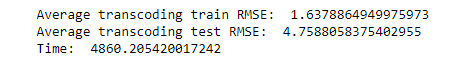

In [ ]:
tic = time()
train, test = neural_network(transcoding_feat, transcoding_target, (200, 200, 200, 200, 200, 200, 200, 200, 200, 200), .01, 'relu')
t_time = time() - tic
# with smaller feat data set
print('\n\nAverage transcoding train RMSE: ', train,'\nAverage transcoding test RMSE: ', test,'\nTime: ',t_time)

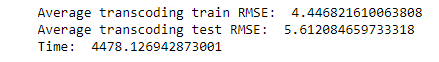

## Random Forest

### Bike Dataset

In [ ]:
rf = RandomForestRegressor(n_estimators = 2000, random_state = 42, max_depth=4)

train_val, test_val = rmse_cal(rf, bike_clean, bike_target)


temp ={}
temp['Train RMSE'] = train_val
temp['Test RMSE'] = test_val

results = pd.DataFrame.from_dict(temp,  orient='index')
results.columns =['RandomForest Results']

results

,RandomForest Results
Train RMSE,676.234994
Test RMSE,951.956127


In [ ]:
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (4,4), dpi=800)
tree.plot_tree(rf.estimators_[4], filled = True);

plt.show()

In [ ]:
rf = RandomForestRegressor(n_estimators = 2000, random_state = 42, max_depth=4)

train_val, test_val = rmse_cal(rf, bike_feat, bike_target)


temp ={}
temp['Train RMSE'] = train_val
temp['Test RMSE'] = test_val

results = pd.DataFrame.from_dict(temp,  orient='index')
results.columns =['RandomForest Results']

results

,RandomForest Results
Train RMSE,702.660216
Test RMSE,971.880932


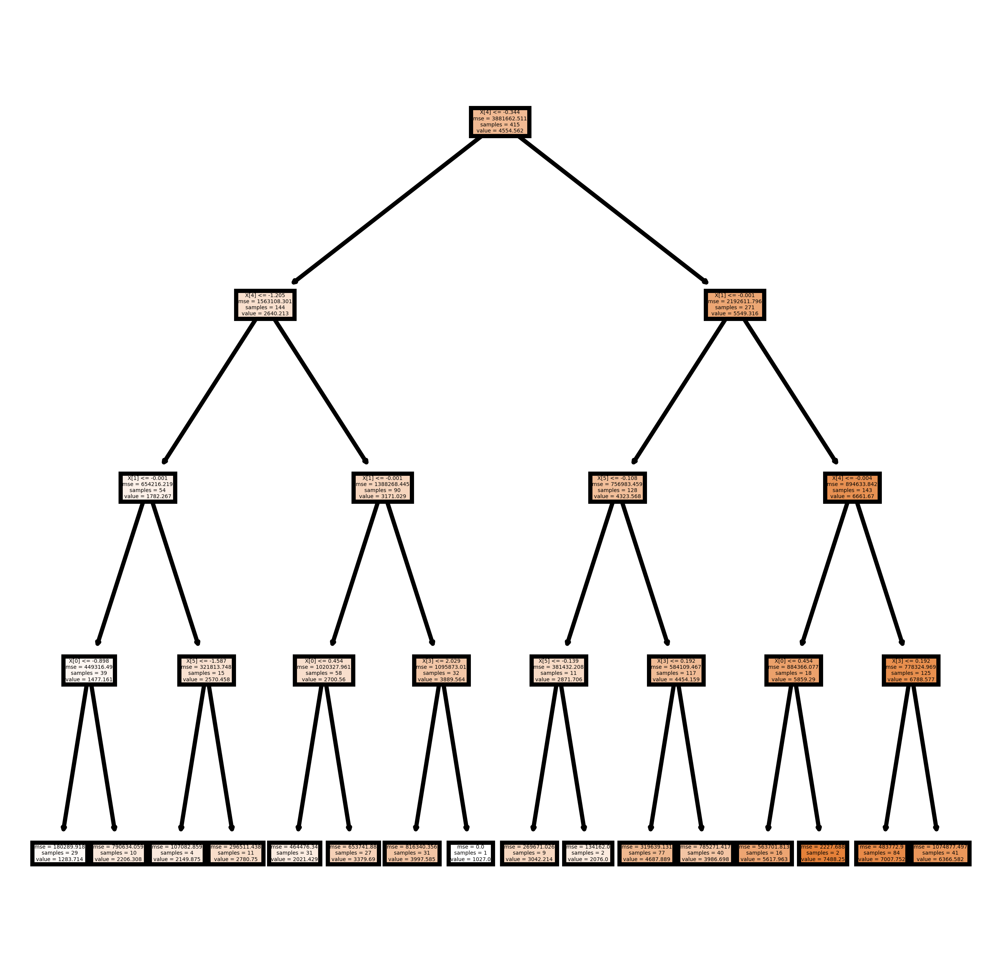

In [ ]:
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (4,4), dpi=800)
tree.plot_tree(rf.estimators_[4], filled = True);

plt.show()

### Master Dataset

In [ ]:
rf = RandomForestRegressor(n_estimators = 500, random_state = 42, max_depth=4)

train_val, test_val = rmse_cal(rf, master_clean, master_target_df)


temp ={}
temp['Train RMSE'] = train_val
temp['Test RMSE'] = test_val

results = pd.DataFrame.from_dict(temp,  orient='index')
results.columns =['RandomForest Results']

results

,RandomForest Results
Train RMSE,11.421277
Test RMSE,12.069506


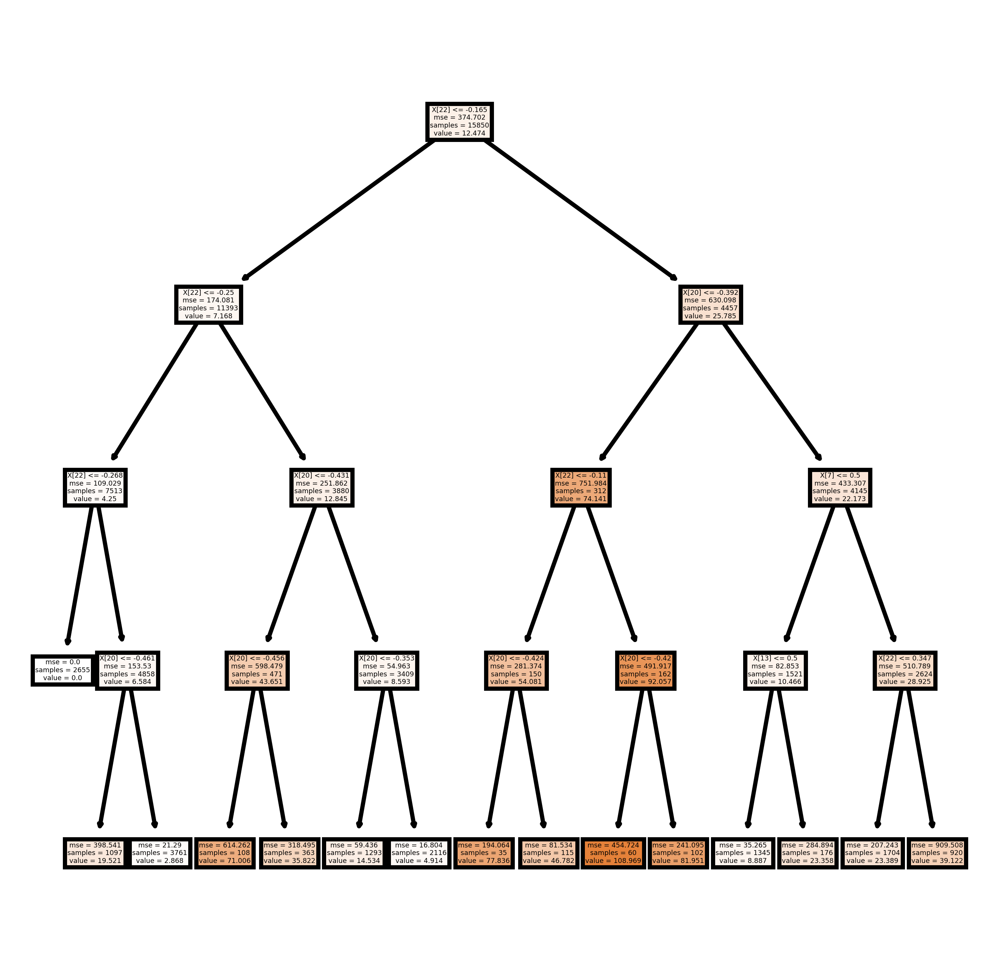

In [ ]:
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (4,4), dpi=800)
tree.plot_tree(rf.estimators_[4], filled = True);

plt.show()

In [ ]:
print('The following is after feature selection:')

rf = RandomForestRegressor(n_estimators = 2000, random_state = 42, max_depth=4)

train_val, test_val = rmse_cal(rf, master_feat, master_target_df)


temp ={}
temp['Train RMSE'] = train_val
temp['Test RMSE'] = test_val

results = pd.DataFrame.from_dict(temp,  orient='index')
results.columns =['RandomForest Results']

results

The following is after feature selection:


,RandomForest Results
Train RMSE,13.189695
Test RMSE,14.045662


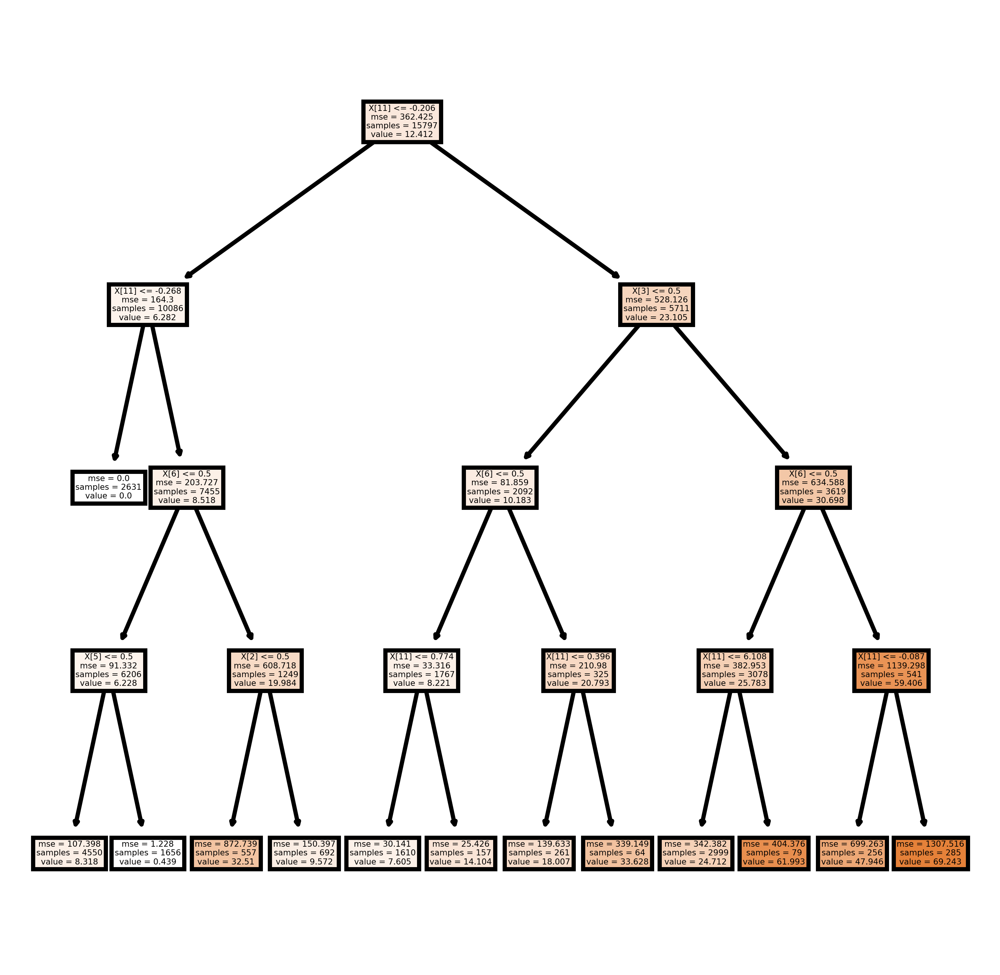

In [ ]:
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (4,4), dpi=800)
tree.plot_tree(rf.estimators_[2], filled = True);

plt.show()

### Transcoding Dataset

In [ ]:
rf = RandomForestRegressor(n_estimators = 500, random_state = 42, max_depth=4)
targets = transcoding_df['utime']
train_val, test_val = rmse_cal(rf, transcoding_clean, targets)


temp ={}
temp['Train RMSE'] = train_val
temp['Test RMSE'] = test_val

results = pd.DataFrame.from_dict(temp,  orient='index')
results.columns =['RandomForest Results']

results

,RandomForest Results
Train RMSE,7.393055
Test RMSE,7.451648


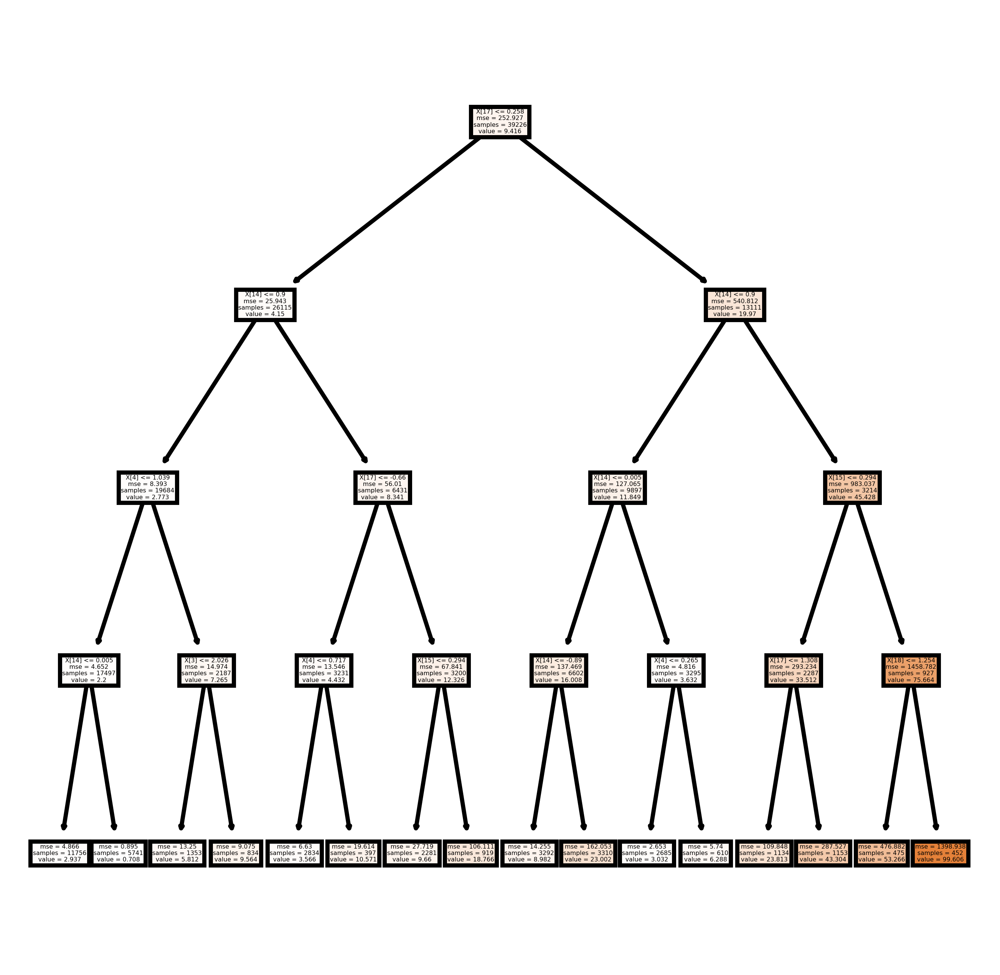

In [ ]:
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (4,4), dpi=800)
tree.plot_tree(rf.estimators_[4], filled = True);

plt.show()

In [ ]:
rf = RandomForestRegressor(n_estimators = 500, random_state = 42, max_depth=4)
targets = transcoding_df['utime']
train_val, test_val = rmse_cal(rf, transcoding_feat, targets)


temp ={}
temp['Train RMSE'] = train_val
temp['Test RMSE'] = test_val

results = pd.DataFrame.from_dict(temp,  orient='index')
results.columns =['RandomForest Results']

results

,RandomForest Results
Train RMSE,7.393055
Test RMSE,7.451648


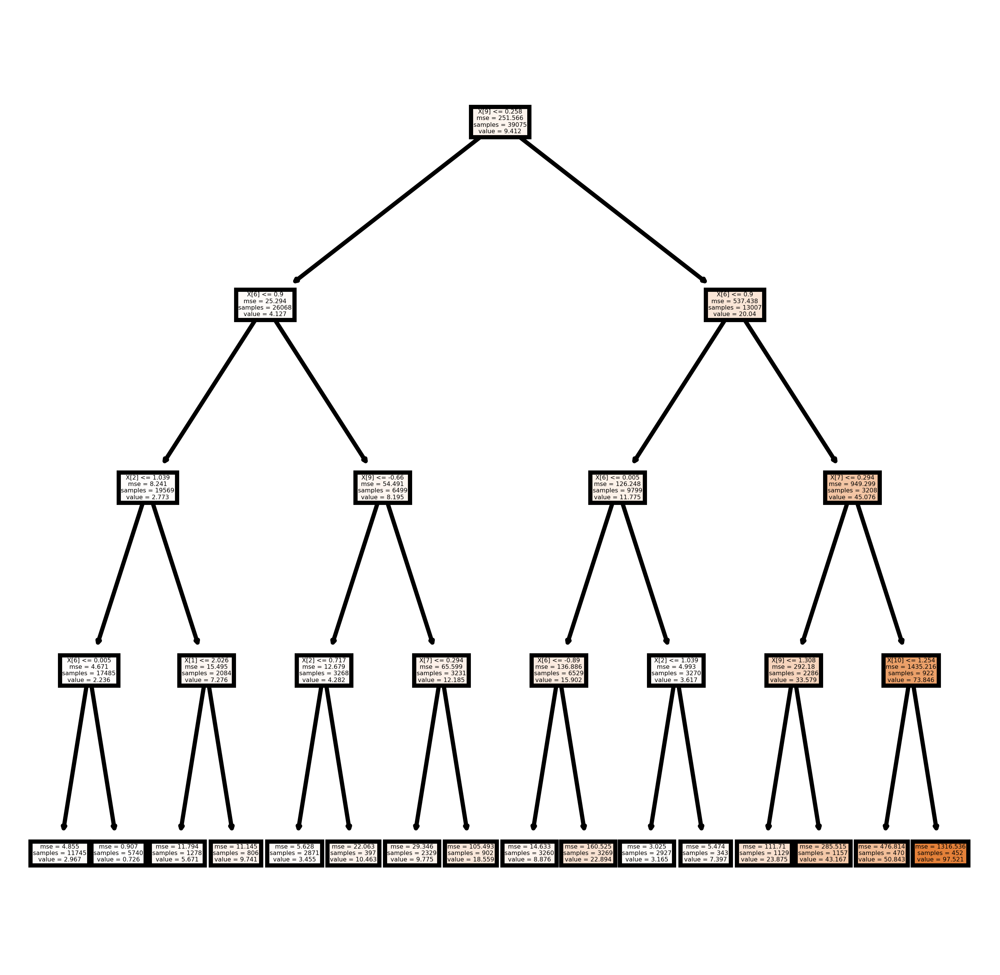

In [ ]:
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (4,4), dpi=800)
tree.plot_tree(rf.estimators_[2], filled = True);

plt.show()

## LightGBM, CatBoost, Bayesian Optimization

In [ ]:
!pip install catboost
!pip install lightgbm
!pip install scikit-optimize

     |████████████████████████████████| 65.7MB 111kB/s 
     |████████████████████████████████| 102kB 4.3MB/s 


In [ ]:
from catboost import CatBoostClassifier, Pool, cv, CatBoostRegressor
import lightgbm as lgb
from lightgbm.sklearn import LGBMModel
from sklearn.metrics import accuracy_score
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error
from skopt import BayesSearchCV


class Boosting():

    def __init__(self, data, target, algo):
        '''
        df : DataFrame containing data
        target : target variable
        '''
        self.data = data
        self.target = target
        self.algo = algo
        self.train_rmse = 0
        self.test_rmse = 0


    def train(self, params):
        '''
        Train the CatBoost Model on 10-fold cross-validation with the parameters 
        given in params dictionary
        '''  
        kf = KFold(n_splits=10)
        for trainset, testset in kf.split(self.data, self.target):

            # make training/testing datasets for fold
            X_train = self.data[trainset,:]
            y_train = self.target[trainset].astype('int')
            X_test = self.data[testset,:]
            y_test = self.target[testset]

            
            if self.algo == 'cat':
                # convert to correct data format
                train = Pool(data=X_train, label=y_train)
                eval = Pool(data=X_test, label=y_test)

                # define model
                model = CatBoostRegressor(loss_function='RMSE',
                                    iterations=params['iterations'],
                                    learning_rate=params['learning_rate'],
                                    depth=params['depth'],
                                    border_count=params['border_count'],
                                    l2_leaf_reg=params['l2_leaf_reg'],
                                    random_seed=42)
        
                # train
                model.fit(train, 
                          use_best_model=True,
                          eval_set=eval, 
                          early_stopping_rounds=5)
                

            elif self.algo == 'lgb':
                # define model with hyperparameters
                model = lgb.LGBMRegressor(boosting_type='gbdt',
                                    num_leaves=params['num_leaves'],
                                    max_depth=params['max_depth'],
                                    learning_rate=params['learning_rate'],
                                    n_estimators=params['num_trees'],
                                    min_child_samples=params['min_data_in_leaf'])
        
                # train        
                model.fit(X_train, y_train, 
                          eval_set=[(X_test, y_test)], 
                          eval_metric='rmse', 
                          early_stopping_rounds=5,
                          verbose=False)

            else:
                print("algo must be either 'cat' or 'lgb' ")
                return 0
        

            # predict
            test_predictions = model.predict(X_test)
            train_predictions = model.predict(X_train)
            self.test_rmse += mean_squared_error(y_test, test_predictions, 
                                                 squared=False)
            self.train_rmse += mean_squared_error(y_train, train_predictions, 
                                                  squared=False)
            
        self.test_rmse /= 10
        self.train_rmse /= 10 
        return [self.train_rmse, self.test_rmse] 




    def bayes_param_search(self):
        '''
        Performs optimization of hyperparameters using Bayesian Optimization
        
        https://medium.com/@pushkarmandot/https-medium-com-pushkarmandot-what-is-lightgbm-how-to-implement-it-how-to-fine-tune-the-parameters-60347819b7fc

        https://machinelearningmastery.com/configure-gradient-boosting-algorithm/

        https://effectiveml.com/using-grid-search-to-optimise-catboost-parameters.html



        Hyperparameters for LightGBM
        num_estimators: max number of trees to fit
        num_leaves: the main parameter to control the complexity of the tree model
                    should be smaller than 2^(max_depth) to avoid overfit 
        max_depth: limits the tree depth explicitly
        min_child_samples: very important parameter to prevent over-fitting 
                          optimal value depends on the number of training samples and num_leaves
                          setting to a large value may cause under-fitting
                          hundreds or thousands is enough for a large dataset
        learning_rate : reducing the gradient step; affects the overall time of training


        Hyperparameters for CatBoost
        iterations : number of trees (same as "num_trees")
        depth : depth of the tree 
        l2_leaf_reg : regularizer to find the best possible
        border_count : number of splits for numerical features
        learning_rate

        '''

        if self.algo == 'cat':
            booster = CatBoostRegressor(loss_function='RMSE', 
                                        random_seed=42)
            params = {
                'iterations': (100, 1000, 'log-uniform'),
                'depth': (2, 4, 6, 8, 10),
                'l2_leaf_reg': (0, 0.05, 1, 3, 5, 10),
                'border_count': (100, 200, 500, 1000, 2000, 5000),
                'learning_rate': (0.001, 0.01, 0.05, 0.1)
            }
        elif self.algo == 'lgb':
            booster = lgb.LGBMRegressor(boosting_type='gbdt')
            params = {
                'num_leaves': (16, 64, 'log-uniform'),
                'max_depth': (2,4, 6, 8, 10),
                'learning_rate': (0.001, 0.01, 0.05, 0.1),
                'n_estimators': (100, 1000, 'log-uniform'),
                'min_child_samples': (50, 100, 200, 500)
            }
        else:
            print("algo must be either 'cat' or 'lgb' ")
            return 0
            

        # define search space
        model = BayesSearchCV(
            booster,
            params,
            cv=10,
            n_iter=10,
            scoring='neg_root_mean_squared_error',
            n_points=2,
            n_jobs=4,
            verbose=1,
            return_train_score=True
        )

        # fit model to data
        model.fit(self.data, self.target)

        # get results
        results = model.cv_results_
        best_score = model.best_score_
        best_setting = model.cv_results_['params'][model.best_index_]

        return [results, best_score, best_setting]


### LightGBM

In [ ]:
'''
Best param search using Bayesian optimization for LightGBM on the bike dataset
'''

lgbm = Boosting(bike_clean, bike_target, algo='lgb')
results, best_score, best_setting = lgbm.bayes_param_search()

Fitting 10 folds for each of 2 candidates, totalling 20 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  20 out of  20 | elapsed:    1.4s finished
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.


Fitting 10 folds for each of 2 candidates, totalling 20 fits


[Parallel(n_jobs=4)]: Done  20 out of  20 | elapsed:    2.0s finished
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.


Fitting 10 folds for each of 2 candidates, totalling 20 fits


[Parallel(n_jobs=4)]: Done  13 out of  20 | elapsed:    1.1s remaining:    0.6s
[Parallel(n_jobs=4)]: Done  20 out of  20 | elapsed:    1.4s finished
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.


Fitting 10 folds for each of 2 candidates, totalling 20 fits


[Parallel(n_jobs=4)]: Done  13 out of  20 | elapsed:    1.7s remaining:    0.9s
[Parallel(n_jobs=4)]: Done  20 out of  20 | elapsed:    2.2s finished


Fitting 10 folds for each of 2 candidates, totalling 20 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  20 out of  20 | elapsed:    2.1s finished


In [ ]:
print(best_score)

-792.7789250403005


In [ ]:
'''
LightGBM using the best features found below on the feature selected bike dataset
'''

params = {}
params['num_leaves'] = best_setting['num_leaves']
params['max_depth'] = best_setting['max_depth']
params['learning_rate'] = best_setting['learning_rate']
params['num_trees'] = best_setting['n_estimators']
params['min_data_in_leaf'] =  best_setting['min_child_samples']

lgbm = Boosting(bike_feat, bike_target, algo='lgb')
train_rmse, test_rmse = lgbm.train(params)

print("train RMSE: ", train_rmse)
print("test RMSE: ", test_rmse)

train RMSE:  867.9628371452421
test RMSE:  868.1911310105952


### CatBoosting

In [ ]:
'''
Best param search using Bayesian optimization for CatBoost on the bike dataset
'''

cat = Boosting(bike_clean, bike_target, algo='cat')
results, best_score, best_setting = cat.bayes_param_search()

Fitting 10 folds for each of 2 candidates, totalling 20 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  20 out of  20 | elapsed:   30.3s finished
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.


Fitting 10 folds for each of 2 candidates, totalling 20 fits


[Parallel(n_jobs=4)]: Done  20 out of  20 | elapsed:  1.1min finished
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.


Fitting 10 folds for each of 2 candidates, totalling 20 fits


[Parallel(n_jobs=4)]: Done  20 out of  20 | elapsed:    9.9s finished
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.


Fitting 10 folds for each of 2 candidates, totalling 20 fits


[Parallel(n_jobs=4)]: Done  20 out of  20 | elapsed:   17.4s finished


Fitting 10 folds for each of 2 candidates, totalling 20 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  20 out of  20 | elapsed:  1.3min finished


0:	learn: 1872.2439479	total: 498us	remaining: 128ms
1:	learn: 1814.6418380	total: 1.2ms	remaining: 152ms
2:	learn: 1759.9132789	total: 1.68ms	remaining: 142ms
3:	learn: 1705.5859327	total: 2.05ms	remaining: 130ms
4:	learn: 1655.8869797	total: 2.52ms	remaining: 127ms
5:	learn: 1609.9687649	total: 3.01ms	remaining: 126ms
6:	learn: 1565.4952956	total: 3.86ms	remaining: 138ms
7:	learn: 1525.2314837	total: 4.3ms	remaining: 134ms
8:	learn: 1488.8660720	total: 6.66ms	remaining: 183ms
9:	learn: 1451.3065492	total: 7.12ms	remaining: 176ms
10:	learn: 1419.3147562	total: 7.54ms	remaining: 169ms
11:	learn: 1387.1677157	total: 8.11ms	remaining: 166ms
12:	learn: 1364.1339200	total: 14.1ms	remaining: 264ms
13:	learn: 1335.0905048	total: 14.6ms	remaining: 254ms
14:	learn: 1304.8607474	total: 15.1ms	remaining: 243ms
15:	learn: 1284.3607843	total: 15.5ms	remaining: 234ms
16:	learn: 1265.8719596	total: 15.9ms	remaining: 225ms
17:	learn: 1243.9649001	total: 16.3ms	remaining: 216ms
18:	learn: 1220.7212586

In [ ]:
print(best_score)

-702.0636067575873


In [ ]:
print(best_setting)

OrderedDict([('border_count', 200), ('depth', 2), ('iterations', 257), ('l2_leaf_reg', 3.0), ('learning_rate', 0.05)])


In [ ]:
'''
CatBoost using the best features found below on the feature selected bike dataset
'''

params = {}
params['iterations'] = best_setting['iterations']
params['depth'] = best_setting['depth']
params['l2_leaf_reg'] = best_setting['l2_leaf_reg']
params['border_count'] = best_setting['border_count']
params['learning_rate'] =  best_setting['learning_rate']

cat = Boosting(bike_feat, bike_target, algo='cat')
train_rmse, test_rmse = cat.train(params)

print("train RMSE: ", train_rmse)
print("test RMSE: ", test_rmse)

0:	learn: 1693.9146180	test: 3240.5664301	best: 3240.5664301 (0)	total: 488us	remaining: 125ms
1:	learn: 1646.9076253	test: 3152.6079582	best: 3152.6079582 (1)	total: 863us	remaining: 110ms
2:	learn: 1603.8774378	test: 3071.9530190	best: 3071.9530190 (2)	total: 1.19ms	remaining: 101ms
3:	learn: 1562.2715986	test: 2990.1328937	best: 2990.1328937 (3)	total: 1.52ms	remaining: 96.1ms
4:	learn: 1522.9254668	test: 2911.2365061	best: 2911.2365061 (4)	total: 1.85ms	remaining: 93.2ms
5:	learn: 1486.5097721	test: 2837.0573019	best: 2837.0573019 (5)	total: 2.22ms	remaining: 92.8ms
6:	learn: 1453.8686388	test: 2768.4848345	best: 2768.4848345 (6)	total: 2.56ms	remaining: 91.5ms
7:	learn: 1425.1261654	test: 2708.2799657	best: 2708.2799657 (7)	total: 2.86ms	remaining: 89ms
8:	learn: 1395.6073590	test: 2643.3941858	best: 2643.3941858 (8)	total: 3.18ms	remaining: 87.6ms
9:	learn: 1366.9462886	test: 2562.6836713	best: 2562.6836713 (9)	total: 3.48ms	remaining: 85.8ms
10:	learn: 1341.1282984	test: 2502.53